In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import collections

from keras.backend.tensorflow_backend import set_session
config = tf.ConfigProto()
config.gpu_options.per_process_gpu_memory_fraction = 0.2
set_session(tf.Session(config=config))

C:\Users\user6\Anaconda3\envs\NP_for_test_JSD_tf13\lib\site-packages\tensorflow\python\framework\dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
C:\Users\user6\Anaconda3\envs\NP_for_test_JSD_tf13\lib\site-packages\tensorflow\python\framework\dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
C:\Users\user6\Anaconda3\envs\NP_for_test_JSD_tf13\lib\site-packages\tensorflow\python\framework\dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
C:\Users\user6\Anaconda3\env

In [2]:
# The (A)NP takes as input a `NPRegressionDescription` namedtuple with fields:
#   `query`: a tuple containing ((context_x, context_y), target_x)
#   `target_y`: a tensor containing the ground truth for the targets to be
#     predicted
#   `num_total_points`: A vector containing a scalar that describes the total
#     number of datapoints used (context + target)
#   `num_context_points`: A vector containing a scalar that describes the number
#     of datapoints used as context
# The GPCurvesReader returns the newly sampled data in this format at each
# iteration

NPRegressionDescription = collections.namedtuple(
    "NPRegressionDescription",
    ("query", "target_y", "num_total_points", "num_context_points"))


class GPCurvesReader(object):
  """Generates curves using a Gaussian Process (GP).

  Supports vector inputs (x) and vector outputs (y). Kernel is
  mean-squared exponential, using the x-value l2 coordinate distance scaled by
  some factor chosen randomly in a range. Outputs are independent gaussian
  processes.
  """

  def __init__(self,
               batch_size,
               max_num_context,
               x_size=1,
               y_size=1,
               l1_scale=0.05,
               sigma_scale=1.0,
               random_kernel_parameters=False,
               testing=False):
    """Creates a regression dataset of functions sampled from a GP.

    Args:
      batch_size: An integer.
      max_num_context: The max number of observations in the context.
      x_size: Integer >= 1 for length of "x values" vector.
      y_size: Integer >= 1 for length of "y values" vector.
      l1_scale: Float; typical scale for kernel distance function.
      sigma_scale: Float; typical scale for variance.
      random_kernel_parameters: If `True`, the kernel parameters (l1 and sigma) 
          will be sampled uniformly within [0.1, l1_scale] and [0.1, sigma_scale].
      testing: Boolean that indicates whether we are testing. If so there are
          more targets for visualization.
    """
    self._batch_size = batch_size
    self._max_num_context = max_num_context
    self._x_size = x_size
    self._y_size = y_size
    self._l1_scale = l1_scale
    self._sigma_scale = sigma_scale
    self._random_kernel_parameters = random_kernel_parameters
    self._testing = testing

  def _gaussian_kernel(self, xdata, l1, sigma_f, sigma_noise=2e-2):
    """Applies the Gaussian kernel to generate curve data.

    Args:
      xdata: Tensor of shape [B, num_total_points, x_size] with
          the values of the x-axis data.
      l1: Tensor of shape [B, y_size, x_size], the scale
          parameter of the Gaussian kernel.
      sigma_f: Tensor of shape [B, y_size], the magnitude
          of the std.
      sigma_noise: Float, std of the noise that we add for stability.

    Returns:
      The kernel, a float tensor of shape
      [B, y_size, num_total_points, num_total_points].
    """
    num_total_points = tf.shape(xdata)[1]

    # Expand and take the difference
    xdata1 = tf.expand_dims(xdata, axis=1)  # [B, 1, num_total_points, x_size]
    xdata2 = tf.expand_dims(xdata, axis=2)  # [B, num_total_points, 1, x_size]
    diff = xdata1 - xdata2  # [B, num_total_points, num_total_points, x_size]

    # [B, y_size, num_total_points, num_total_points, x_size]
    norm = tf.square(diff[:, None, :, :, :] / l1[:, :, None, None, :])

    norm = tf.reduce_sum(
        norm, -1)  # [B, data_size, num_total_points, num_total_points]

    # [B, y_size, num_total_points, num_total_points]
    kernel = tf.square(sigma_f)[:, :, None, None] * tf.exp(-0.5 * norm)

    # Add some noise to the diagonal to make the cholesky work.
    kernel += (sigma_noise**2) * tf.eye(num_total_points)

    return kernel

  def generate_curves(self):
    """Builds the op delivering the data.

    Generated functions are `float32` with x values between -2 and 2.
    
    Returns:
      A `NPRegressionDescription` namedtuple.
    """
    num_context = tf.random_uniform(
        shape=[], minval=3, maxval=self._max_num_context, dtype=tf.int32)

    # If we are testing we want to have more targets and have them evenly
    # distributed in order to plot the function.
    if self._testing:
      num_target = 400
      num_total_points = num_target
      x_values = tf.tile(
          tf.expand_dims(tf.range(-2., 2., 1. / 100, dtype=tf.float32), axis=0),
          [self._batch_size, 1])
      x_values = tf.expand_dims(x_values, axis=-1)
    # During training the number of target points and their x-positions are
    # selected at random
    else:
      num_target = tf.random_uniform(shape=(), minval=0, 
                                     maxval=self._max_num_context - num_context,
                                     dtype=tf.int32)
      num_total_points = num_context + num_target
      x_values = tf.random_uniform(
          [self._batch_size, num_total_points, self._x_size], -2, 2)

    # Set kernel parameters
    # Either choose a set of random parameters for the mini-batch
    if self._random_kernel_parameters:
      l1 = tf.random_uniform([self._batch_size, self._y_size,
                              self._x_size], 0.1, self._l1_scale)
      sigma_f = tf.random_uniform([self._batch_size, self._y_size],
                                  0.1, self._sigma_scale)
    # Or use the same fixed parameters for all mini-batches
    else:
      l1 = tf.ones(shape=[self._batch_size, self._y_size,
                          self._x_size]) * self._l1_scale
      sigma_f = tf.ones(shape=[self._batch_size,
                               self._y_size]) * self._sigma_scale

    # Pass the x_values through the Gaussian kernel
    # [batch_size, y_size, num_total_points, num_total_points]
    kernel = self._gaussian_kernel(x_values, l1, sigma_f)

    # Calculate Cholesky, using double precision for better stability:
    cholesky = tf.cast(tf.cholesky(tf.cast(kernel, tf.float64)), tf.float32)

    # Sample a curve
    # [batch_size, y_size, num_total_points, 1]
    y_values = tf.matmul(
        cholesky,
        tf.random_normal([self._batch_size, self._y_size, num_total_points, 1]))

    # [batch_size, num_total_points, y_size]
    y_values = tf.transpose(tf.squeeze(y_values, 3), [0, 2, 1])

    if self._testing:
      # Select the targets
      target_x = x_values
      target_y = y_values

      # Select the observations
      idx = tf.random_shuffle(tf.range(num_target))
      context_x = tf.gather(x_values, idx[:num_context], axis=1)
      context_y = tf.gather(y_values, idx[:num_context], axis=1)

    else:
      # Select the targets which will consist of the context points as well as
      # some new target points
      target_x = x_values[:, :num_target + num_context, :]
      target_y = y_values[:, :num_target + num_context, :]

      # Select the observations
      context_x = x_values[:, :num_context, :]
      context_y = y_values[:, :num_context, :]

    query = ((context_x, context_y), target_x)

    return NPRegressionDescription(
        query=query,
        target_y=target_y,
        num_total_points=tf.shape(target_x)[1],
        num_context_points=num_context)

In [3]:
# utility methods
def batch_mlp(input, output_sizes, variable_scope):
  """Apply MLP to the final axis of a 3D tensor (reusing already defined MLPs).
  
  Args:
    input: input tensor of shape [B,n,d_in].
    output_sizes: An iterable containing the output sizes of the MLP as defined 
        in `basic.Linear`.
    variable_scope: String giving the name of the variable scope. If this is set
        to be the same as a previously defined MLP, then the weights are reused.
    
  Returns:
    tensor of shape [B,n,d_out] where d_out=output_sizes[-1]
  """
  # Get the shapes of the input and reshape to parallelise across observations
  batch_size, _, filter_size = input.shape.as_list()
  output = tf.reshape(input, (-1, filter_size))
  output.set_shape((None, filter_size))

  # Pass through MLP
  with tf.variable_scope(variable_scope, reuse=tf.AUTO_REUSE):
    for i, size in enumerate(output_sizes[:-1]):
      output = tf.nn.relu(
          tf.layers.dense(output, size, name="layer_{}".format(i)))

    # Last layer without a ReLu
    output = tf.layers.dense(
        output, output_sizes[-1], name="layer_{}".format(i + 1))

  # Bring back into original shape
  output = tf.reshape(output, (batch_size, -1, output_sizes[-1]))
  return output

In [4]:
class DeterministicEncoder(object):
  """The Deterministic Encoder."""

  def __init__(self, output_sizes, attention):
    """(A)NP deterministic encoder.

    Args:
      output_sizes: An iterable containing the output sizes of the encoding MLP.
      attention: The attention module.
    """
    self._output_sizes = output_sizes
    self._attention = attention

  def __call__(self, context_x, context_y, target_x):
    """Encodes the inputs into one representation.

    Args:
      context_x: Tensor of shape [B,observations,d_x]. For this 1D regression
          task this corresponds to the x-values.
      context_y: Tensor of shape [B,observations,d_y]. For this 1D regression
          task this corresponds to the y-values.
      target_x: Tensor of shape [B,target_observations,d_x]. 
          For this 1D regression task this corresponds to the x-values.

    Returns:
      The encoded representation. Tensor of shape [B,target_observations,d]
    """

    # Concatenate x and y along the filter axes
    encoder_input = tf.concat([context_x, context_y], axis=-1)

    # Pass final axis through MLP
    hidden = batch_mlp(encoder_input, self._output_sizes, 
                       "deterministic_encoder")

    # Apply attention
    with tf.variable_scope("deterministic_encoder", reuse=tf.AUTO_REUSE):
        hidden = self._attention(context_x, target_x, hidden)

    return hidden


In [5]:
class LatentEncoder(object):
  """The Latent Encoder."""

  def __init__(self, output_sizes, num_latents):
    """(A)NP latent encoder.

    Args:
      output_sizes: An iterable containing the output sizes of the encoding MLP.
      num_latents: The latent dimensionality.
    """
    self._output_sizes = output_sizes
    self._num_latents = num_latents

  def __call__(self, x, y):
    """Encodes the inputs into one representation.

    Args:
      x: Tensor of shape [B,observations,d_x]. For this 1D regression
          task this corresponds to the x-values.
      y: Tensor of shape [B,observations,d_y]. For this 1D regression
          task this corresponds to the y-values.

    Returns:
      A normal distribution over tensors of shape [B, num_latents]
    """

    # Concatenate x and y along the filter axes
    encoder_input = tf.concat([x, y], axis=-1)

    # Pass final axis through MLP
    hidden = batch_mlp(encoder_input, self._output_sizes, "latent_encoder")
      
    # Aggregator: take the mean over all points
    hidden = tf.reduce_mean(hidden, axis=1)
    
    # Have further MLP layers that map to the parameters of the Gaussian latent
    with tf.variable_scope("latent_encoder", reuse=tf.AUTO_REUSE):
      # First apply intermediate relu layer 
      hidden = tf.nn.relu(
          tf.layers.dense(hidden, 
                          (self._output_sizes[-1] + self._num_latents)/2, 
                          name="penultimate_layer"))
      # Then apply further linear layers to output latent mu and log sigma
      mu = tf.layers.dense(hidden, self._num_latents, name="mean_layer")
      log_sigma = tf.layers.dense(hidden, self._num_latents, name="std_layer")
      
    # Compute sigma
    sigma = 0.1 + 0.9 * tf.sigmoid(log_sigma)

    return tf.contrib.distributions.Normal(loc=mu, scale=sigma)


In [6]:
class Decoder(object):
  """The Decoder."""

  def __init__(self, output_sizes):
    """(A)NP decoder.

    Args:
      output_sizes: An iterable containing the output sizes of the decoder MLP 
          as defined in `basic.Linear`.
    """
    self._output_sizes = output_sizes

  def __call__(self, representation, target_x):
    """Decodes the individual targets.

    Args:
      representation: The representation of the context for target predictions. 
          Tensor of shape [B,target_observations,?].
      target_x: The x locations for the target query.
          Tensor of shape [B,target_observations,d_x].

    Returns:
      dist: A multivariate Gaussian over the target points. A distribution over
          tensors of shape [B,target_observations,d_y].
      mu: The mean of the multivariate Gaussian.
          Tensor of shape [B,target_observations,d_x].
      sigma: The standard deviation of the multivariate Gaussian.
          Tensor of shape [B,target_observations,d_x].
    """
    # concatenate target_x and representation
    hidden = tf.concat([representation, target_x], axis=-1)
    
    # Pass final axis through MLP
    hidden = batch_mlp(hidden, self._output_sizes, "decoder")

    # Get the mean an the variance
    mu, log_sigma = tf.split(hidden, 2, axis=-1)

    # Bound the variance
    sigma = 0.1 + 0.9 * tf.nn.softplus(log_sigma)

    # Get the distribution
    dist = tf.contrib.distributions.MultivariateNormalDiag(
        loc=mu, scale_diag=sigma)

    return dist, mu, sigma

In [7]:
class LatentModel(object):
  """The (A)NP model."""

  def __init__(self, latent_encoder_output_sizes, num_latents,
               decoder_output_sizes, use_deterministic_path=True, 
               deterministic_encoder_output_sizes=None, attention=None):
    """Initialises the model.

    Args:
      latent_encoder_output_sizes: An iterable containing the sizes of hidden 
          layers of the latent encoder.
      num_latents: The latent dimensionality.
      decoder_output_sizes: An iterable containing the sizes of hidden layers of
          the decoder. The last element should correspond to d_y * 2
          (it encodes both mean and variance concatenated)
      use_deterministic_path: a boolean that indicates whether the deterministic
          encoder is used or not.
      deterministic_encoder_output_sizes: An iterable containing the sizes of 
          hidden layers of the deterministic encoder. The last one is the size 
          of the deterministic representation r.
      attention: The attention module used in the deterministic encoder.
          Only relevant when use_deterministic_path=True.
    """
    self._latent_encoder = LatentEncoder(latent_encoder_output_sizes, 
                                         num_latents)
    self._decoder = Decoder(decoder_output_sizes)
    self._use_deterministic_path = use_deterministic_path
    if use_deterministic_path:
      self._deterministic_encoder = DeterministicEncoder(
          deterministic_encoder_output_sizes, attention)
    

  def __call__(self, query, num_targets, target_y=None):
    """Returns the predicted mean and variance at the target points.

    Args:
      query: Array containing ((context_x, context_y), target_x) where:
          context_x: Tensor of shape [B,num_contexts,d_x]. 
              Contains the x values of the context points.
          context_y: Tensor of shape [B,num_contexts,d_y]. 
              Contains the y values of the context points.
          target_x: Tensor of shape [B,num_targets,d_x]. 
              Contains the x values of the target points.
      num_targets: Number of target points.
      target_y: The ground truth y values of the target y. 
          Tensor of shape [B,num_targets,d_y].

    Returns:
      log_p: The log_probability of the target_y given the predicted
          distribution. Tensor of shape [B,num_targets].
      mu: The mean of the predicted distribution. 
          Tensor of shape [B,num_targets,d_y].
      sigma: The variance of the predicted distribution.
          Tensor of shape [B,num_targets,d_y].
    """

    (context_x, context_y), target_x = query

    # Pass query through the encoder and the decoder
    prior = self._latent_encoder(context_x, context_y)
    
    # For training, when target_y is available, use targets for latent encoder.
    # Note that targets contain contexts by design.
    if target_y is None:
      latent_rep = prior.sample()
    # For testing, when target_y unavailable, use contexts for latent encoder.
    else:
      posterior = self._latent_encoder(target_x, target_y)
      latent_rep = posterior.sample()
    latent_rep = tf.tile(tf.expand_dims(latent_rep, axis=1),
                         [1, num_targets, 1])
    if self._use_deterministic_path:
      deterministic_rep = self._deterministic_encoder(context_x, context_y,
                                                      target_x)
      representation = tf.concat([deterministic_rep, latent_rep], axis=-1)
    else:
      representation = latent_rep
      
    dist, mu, sigma = self._decoder(representation, target_x)
    
    # If we want to calculate the log_prob for training we will make use of the
    # target_y. At test time the target_y is not available so we return None.
    if target_y is not None:
      log_p = dist.log_prob(target_y)
      posterior = self._latent_encoder(target_x, target_y)
      kl = tf.reduce_sum(
          tf.contrib.distributions.kl_divergence(posterior, prior), 
          axis=-1, keepdims=True)
      kl = tf.tile(kl, [1, num_targets])
      loss = - tf.reduce_mean(log_p - kl / tf.cast(num_targets, tf.float32))
    else:
      log_p = None
      kl = None
      loss = None

    return mu, sigma, log_p, kl, loss


In [8]:
def uniform_attention(q, v):
  """Uniform attention. Equivalent to np.

  Args:
    q: queries. tensor of shape [B,m,d_k].
    v: values. tensor of shape [B,n,d_v].
    
  Returns:
    tensor of shape [B,m,d_v].
  """
  total_points = tf.shape(q)[1]
  rep = tf.reduce_mean(v, axis=1, keepdims=True)  # [B,1,d_v]
  rep = tf.tile(rep, [1, total_points, 1])
  return rep

def laplace_attention(q, k, v, scale, normalise):
  """Computes laplace exponential attention.

  Args:
    q: queries. tensor of shape [B,m,d_k].
    k: keys. tensor of shape [B,n,d_k].
    v: values. tensor of shape [B,n,d_v].
    scale: float that scales the L1 distance.
    normalise: Boolean that determines whether weights sum to 1.
    
  Returns:
    tensor of shape [B,m,d_v].
  """
  k = tf.expand_dims(k, axis=1)  # [B,1,n,d_k]
  q = tf.expand_dims(q, axis=2)  # [B,m,1,d_k]
  unnorm_weights = - tf.abs((k - q) / scale)  # [B,m,n,d_k]
  unnorm_weights = tf.reduce_sum(unnorm_weights, axis=-1)  # [B,m,n]
  if normalise:
    weight_fn = tf.nn.softmax
  else:
    weight_fn = lambda x: 1 + tf.tanh(x)
  weights = weight_fn(unnorm_weights)  # [B,m,n]
  rep = tf.einsum('bik,bkj->bij', weights, v)  # [B,m,d_v]
  return rep


def dot_product_attention(q, k, v, normalise):
  """Computes dot product attention.

  Args:
    q: queries. tensor of  shape [B,m,d_k].
    k: keys. tensor of shape [B,n,d_k].
    v: values. tensor of shape [B,n,d_v].
    normalise: Boolean that determines whether weights sum to 1.
    
  Returns:
    tensor of shape [B,m,d_v].
  """
  d_k = tf.shape(q)[-1]
  scale = tf.sqrt(tf.cast(d_k, tf.float32))
  unnorm_weights = tf.einsum('bjk,bik->bij', k, q) / scale  # [B,m,n]
  if normalise:
    weight_fn = tf.nn.softmax
  else:
    weight_fn = tf.sigmoid
  weights = weight_fn(unnorm_weights)  # [B,m,n]
  rep = tf.einsum('bik,bkj->bij', weights, v)  # [B,m,d_v]
  return rep


def multihead_attention(q, k, v, num_heads=8):
  """Computes multi-head attention.

  Args:
    q: queries. tensor of  shape [B,m,d_k].
    k: keys. tensor of shape [B,n,d_k].
    v: values. tensor of shape [B,n,d_v].
    num_heads: number of heads. Should divide d_v.
    
  Returns:
    tensor of shape [B,m,d_v].
  """
  d_k = q.get_shape().as_list()[-1]
  d_v = v.get_shape().as_list()[-1]
  head_size = d_v / num_heads
  key_initializer = tf.random_normal_initializer(stddev=d_k**-0.5)
  value_initializer = tf.random_normal_initializer(stddev=d_v**-0.5)
  rep = tf.constant(0.0)
  for h in range(num_heads):
    o = dot_product_attention(
        tf.layers.Conv1D(head_size, 1, kernel_initializer=key_initializer,
                   name='wq%d' % h, use_bias=False, padding='VALID')(q),
        tf.layers.Conv1D(head_size, 1, kernel_initializer=key_initializer,
                   name='wk%d' % h, use_bias=False, padding='VALID')(k),
        tf.layers.Conv1D(head_size, 1, kernel_initializer=key_initializer,
                   name='wv%d' % h, use_bias=False, padding='VALID')(v),
        normalise=True)
    rep += tf.layers.Conv1D(d_v, 1, kernel_initializer=value_initializer,
                      name='wo%d' % h, use_bias=False, padding='VALID')(o)
  return rep

class Attention(object):
  """The Attention module."""

  def __init__(self, rep, output_sizes, att_type, scale=1., normalise=True,
               num_heads=8):
    """Create attention module.

    Takes in context inputs, target inputs and
    representations of each context input/output pair
    to output an aggregated representation of the context data.
    Args:
      rep: transformation to apply to contexts before computing attention. 
          One of: ['identity','mlp'].
      output_sizes: list of number of hidden units per layer of mlp.
          Used only if rep == 'mlp'.
      att_type: type of attention. One of the following:
          ['uniform','laplace','dot_product','multihead']
      scale: scale of attention.
      normalise: Boolean determining whether to:
          1. apply softmax to weights so that they sum to 1 across context pts or
          2. apply custom transformation to have weights in [0,1].
      num_heads: number of heads for multihead.
    """
    self._rep = rep
    self._output_sizes = output_sizes
    self._type = att_type
    self._scale = scale
    self._normalise = normalise
    if self._type == 'multihead':
      self._num_heads = num_heads

  def __call__(self, x1, x2, r):
    """Apply attention to create aggregated representation of r.

    Args:
      x1: tensor of shape [B,n1,d_x].
      x2: tensor of shape [B,n2,d_x].
      r: tensor of shape [B,n1,d].
      
    Returns:
      tensor of shape [B,n2,d]

    Raises:
      NameError: The argument for rep/type was invalid.
    """
    if self._rep == 'identity':
      k, q = (x1, x2)
    elif self._rep == 'mlp':
      # Pass through MLP
      k = batch_mlp(x1, self._output_sizes, "attention")
      q = batch_mlp(x2, self._output_sizes, "attention")
    else:
      raise NameError("'rep' not among ['identity','mlp']")

    if self._type == 'uniform':
      rep = uniform_attention(q, r)
    elif self._type == 'laplace':
      rep = laplace_attention(q, k, r, self._scale, self._normalise)
    elif self._type == 'dot_product':
      rep = dot_product_attention(q, k, r, self._normalise)
    elif self._type == 'multihead':
      rep = multihead_attention(q, k, r, self._num_heads)
    else:
      raise NameError(("'att_type' not among ['uniform','laplace','dot_product'"
                       ",'multihead']"))

    return rep

In [9]:
def plot_functions(target_x, target_y, context_x, context_y, pred_y, std):
  """Plots the predicted mean and variance and the context points.
  
  Args: 
    target_x: An array of shape [B,num_targets,1] that contains the
        x values of the target points.
    target_y: An array of shape [B,num_targets,1] that contains the
        y values of the target points.
    context_x: An array of shape [B,num_contexts,1] that contains 
        the x values of the context points.
    context_y: An array of shape [B,num_contexts,1] that contains 
        the y values of the context points.
    pred_y: An array of shape [B,num_targets,1] that contains the
        predicted means of the y values at the target points in target_x.
    std: An array of shape [B,num_targets,1] that contains the
        predicted std dev of the y values at the target points in target_x.
  """
  # Plot everything
  plt.plot(target_x[0], pred_y[0], 'b', linewidth=2)
  plt.plot(target_x[0], target_y[0], 'k:', linewidth=2)
  plt.plot(context_x[0], context_y[0], 'ko', markersize=10)
  plt.fill_between(
      target_x[0, :, 0],
      pred_y[0, :, 0] - std[0, :, 0],
      pred_y[0, :, 0] + std[0, :, 0],
      alpha=0.2,
      facecolor='#65c9f7',
      interpolate=True)

  # Make the plot pretty
  plt.yticks([-2, 0, 2], fontsize=16)
  plt.xticks([-2, 0, 2], fontsize=16)
  plt.ylim([-2, 2])
  plt.grid('off')
  ax = plt.gca()
  plt.show()

In [10]:
TRAINING_ITERATIONS = 200000 #@param {type:"number"}
# TRAINING_ITERATIONS = 33333
MAX_CONTEXT_POINTS = 100 #@param {type:"number"}
# PLOT_AFTER = 10000 #@param {type:"number"}
PLOT_AFTER = 1000
HIDDEN_SIZE = 128 #@param {type:"number"}
MODEL_TYPE = 'ANP' #@param ['NP','ANP']
ATTENTION_TYPE = 'multihead' #@param ['uniform','laplace','dot_product','multihead']
random_kernel_parameters = False #@param {type:"boolean"}

tf.reset_default_graph()
# Train dataset
dataset_train = GPCurvesReader(
    batch_size=16, max_num_context=MAX_CONTEXT_POINTS, random_kernel_parameters=False)
data_train = dataset_train.generate_curves()

# Test dataset
dataset_test = GPCurvesReader(
    batch_size=10, max_num_context=MAX_CONTEXT_POINTS, random_kernel_parameters=False, testing=True)
data_test = dataset_test.generate_curves()


# Sizes of the layers of the MLPs for the encoders and decoder
# The final output layer of the decoder outputs two values, one for the mean and
# one for the variance of the prediction at the target location
latent_encoder_output_sizes = [HIDDEN_SIZE]*4
num_latents = HIDDEN_SIZE
deterministic_encoder_output_sizes= [HIDDEN_SIZE]*4
decoder_output_sizes = [HIDDEN_SIZE]*2 + [2]
use_deterministic_path = True

# ANP with multihead attention
if MODEL_TYPE == 'ANP':
  attention = Attention(rep='mlp', output_sizes=[HIDDEN_SIZE]*2, 
                        att_type='multihead')
# NP - equivalent to uniform attention
elif MODEL_TYPE == 'NP':
  attention = Attention(rep='identity', output_sizes=None, att_type='uniform')
else:
  raise NameError("MODEL_TYPE not among ['ANP,'NP']")

# Define the model
model = LatentModel(latent_encoder_output_sizes, num_latents,
                    decoder_output_sizes, use_deterministic_path, 
                    deterministic_encoder_output_sizes, attention)

# Define the loss
_, _, log_prob, _, loss = model(data_train.query, data_train.num_total_points,
                                 data_train.target_y)

# Get the predicted mean and variance at the target points for the testing set
mu, sigma, _, _, _ = model(data_test.query, data_test.num_total_points)

# Set up the optimizer and train step
optimizer = tf.train.AdamOptimizer(1e-4)
train_step = optimizer.minimize(loss)
init = tf.initialize_all_variables()



Instructions for updating:
Use keras.layers.dense instead.
Instructions for updating:
Colocations handled automatically by placer.

For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.

Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should update all references to use `tfp.distributions` instead of `tf.distributions`.
Instructions for updating:
The TensorFlow Distributions library has moved to TensorFlow Probability (https://github.com/tensorflow/probability). You should updat

In [11]:
ewma_value = 0
ewma_list = []

Iteration: 0, loss: 1.6837409734725952


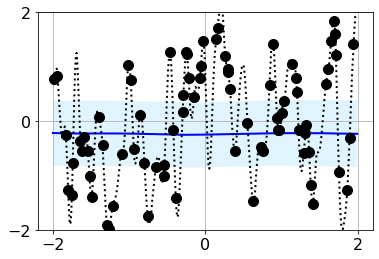

Iteration: 1000, loss: 1.3517591953277588


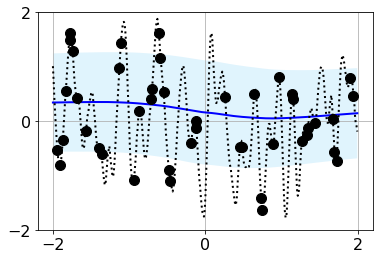

Iteration: 2000, loss: 1.2622991800308228


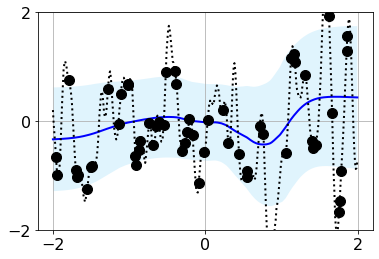

Iteration: 3000, loss: 0.8081631064414978


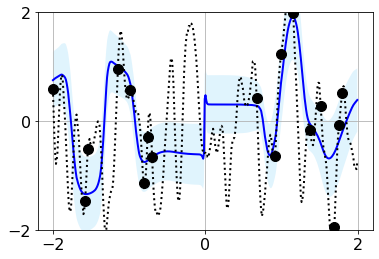

Iteration: 4000, loss: 1.3075931072235107


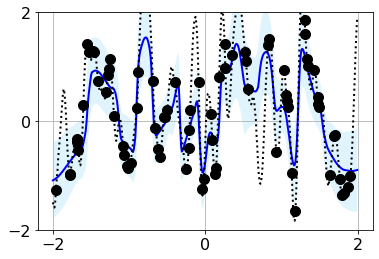

Iteration: 5000, loss: 0.5507211089134216


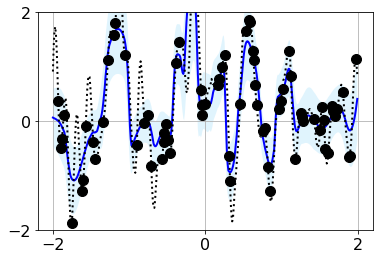

Iteration: 6000, loss: 0.5341777205467224


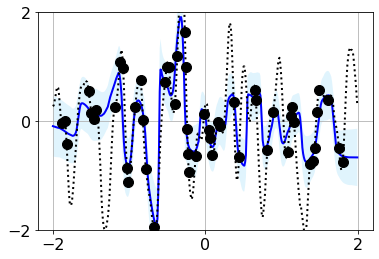

Iteration: 7000, loss: 0.7944037914276123


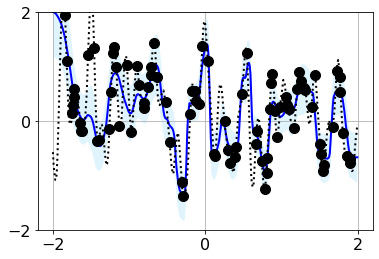

Iteration: 8000, loss: 0.8532658815383911


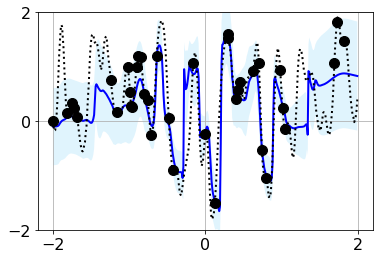

Iteration: 9000, loss: 0.4568500816822052


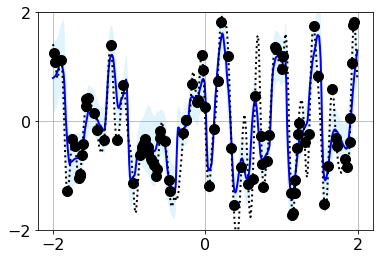

Iteration: 10000, loss: 0.4362850487232208


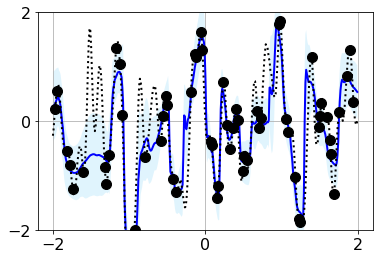

Iteration: 11000, loss: 0.8210915327072144


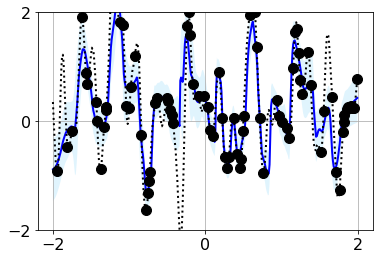

Iteration: 12000, loss: 0.867034912109375


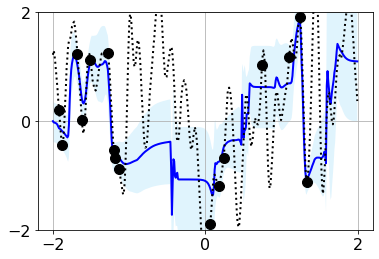

Iteration: 13000, loss: 0.2077093869447708


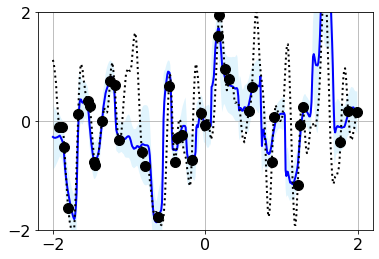

Iteration: 14000, loss: 0.27599266171455383


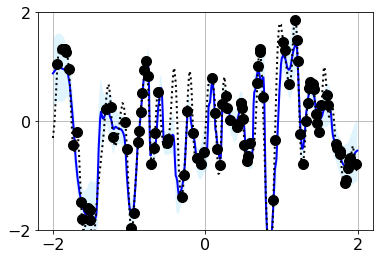

Iteration: 15000, loss: 0.4963500499725342


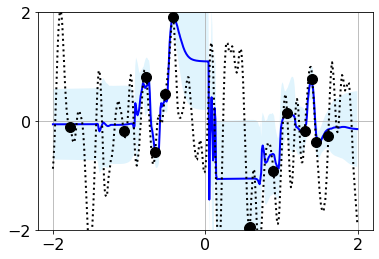

Iteration: 16000, loss: 0.27126410603523254


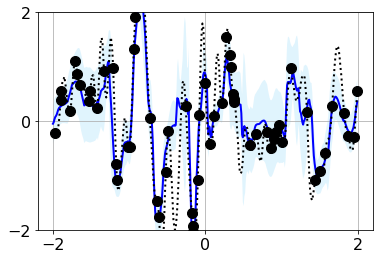

Iteration: 17000, loss: 0.11729211360216141


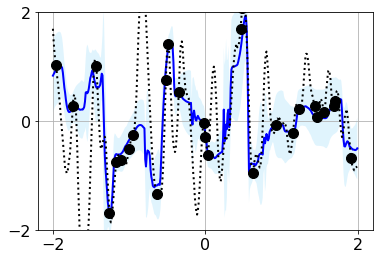

Iteration: 18000, loss: 0.6498649716377258


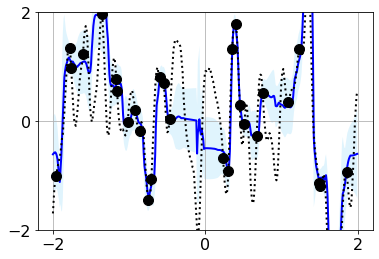

Iteration: 19000, loss: 0.07989363372325897


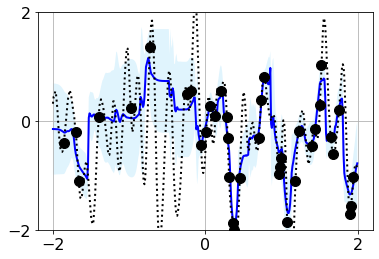

Iteration: 20000, loss: 0.10832830518484116


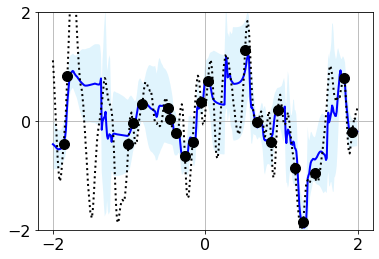

Iteration: 21000, loss: 1.163286566734314


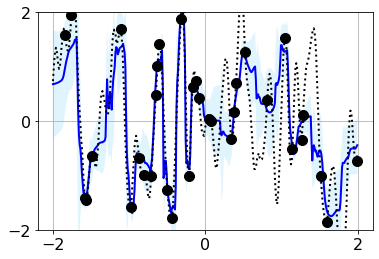

Iteration: 22000, loss: 0.44611310958862305


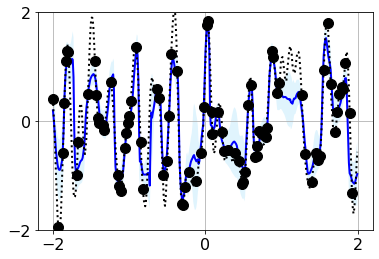

Iteration: 23000, loss: 0.8069679141044617


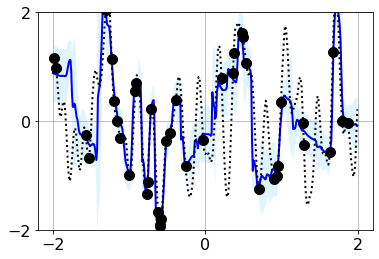

Iteration: 24000, loss: 0.22288763523101807


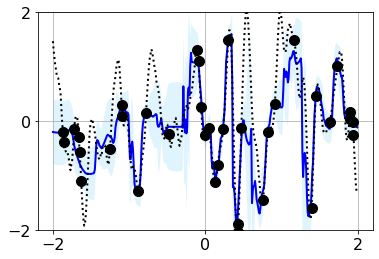

Iteration: 25000, loss: -0.04205454885959625


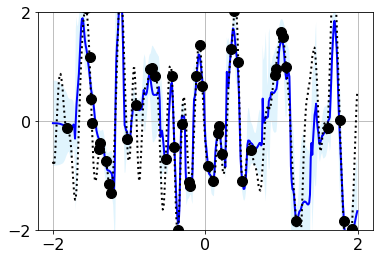

Iteration: 26000, loss: 0.3665211498737335


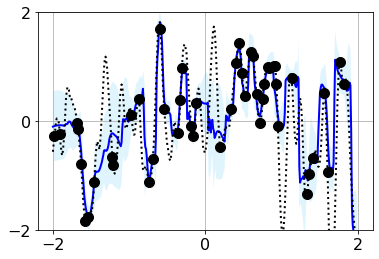

Iteration: 27000, loss: 0.19845455884933472


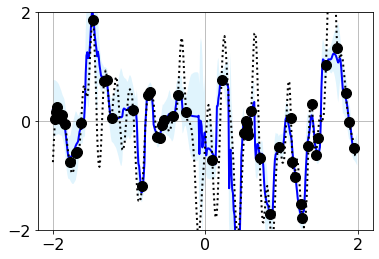

Iteration: 28000, loss: 0.3453885018825531


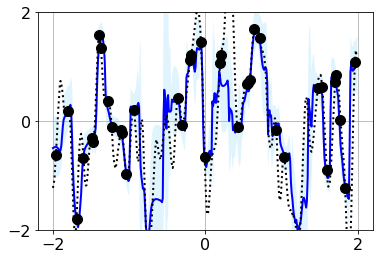

Iteration: 29000, loss: 0.2515818476676941


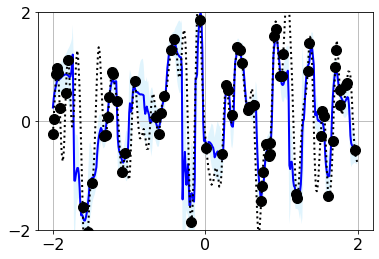

Iteration: 30000, loss: 0.8917678594589233


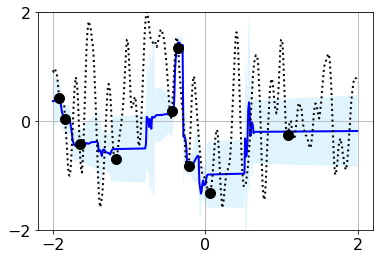

Iteration: 31000, loss: 1.3609166145324707


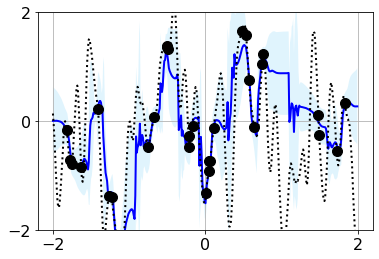

Iteration: 32000, loss: -0.09183462709188461


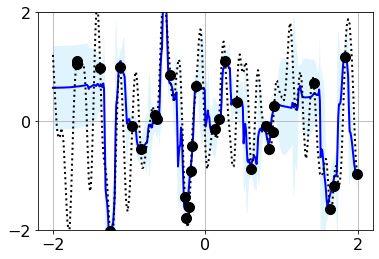

Iteration: 33000, loss: 1.2196438312530518


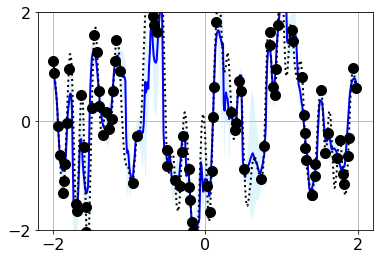

Iteration: 34000, loss: 1.0535238981246948


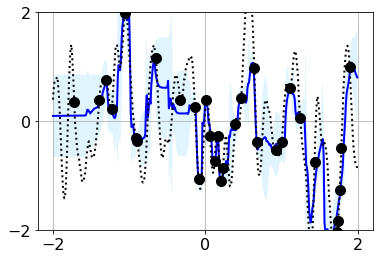

Iteration: 35000, loss: 0.3065410256385803


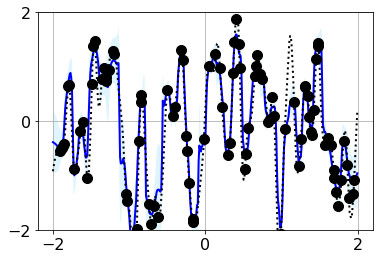

Iteration: 36000, loss: 0.062024377286434174


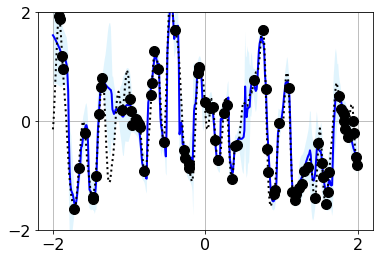

Iteration: 37000, loss: 0.4367411732673645


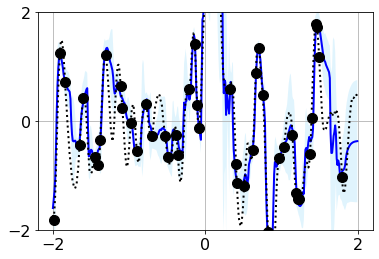

Iteration: 38000, loss: 0.1618398129940033


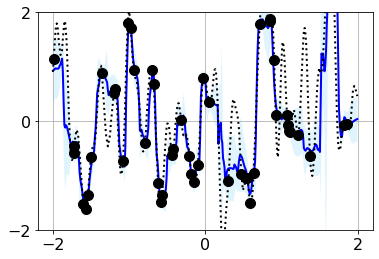

Iteration: 39000, loss: 0.21008674800395966


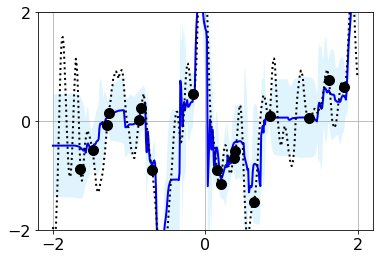

Iteration: 40000, loss: 0.1521383374929428


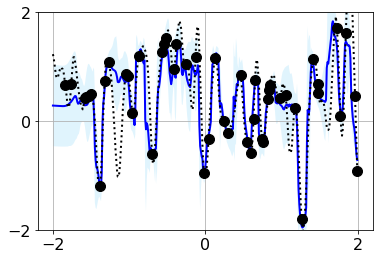

Iteration: 41000, loss: 1.4600385427474976


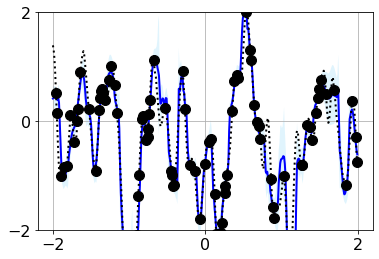

Iteration: 42000, loss: -0.3116132616996765


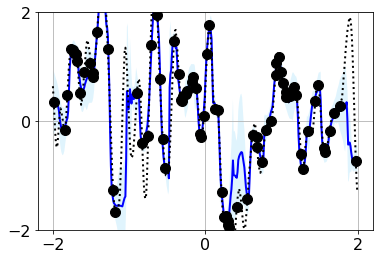

Iteration: 43000, loss: 1.1902724504470825


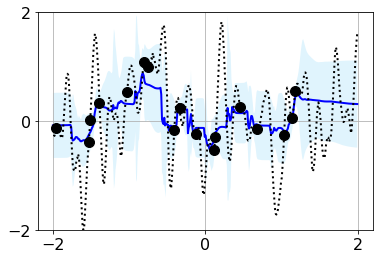

Iteration: 44000, loss: 0.5208889842033386


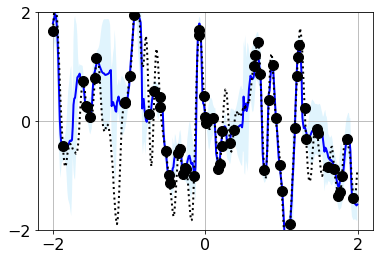

Iteration: 45000, loss: 0.28273889422416687


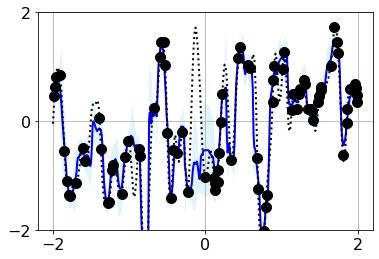

Iteration: 46000, loss: 0.024334916844964027


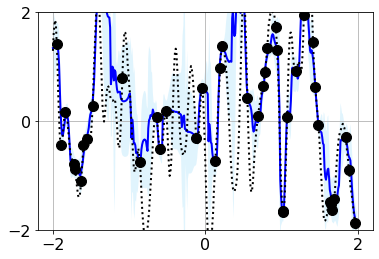

Iteration: 47000, loss: 0.5927091240882874


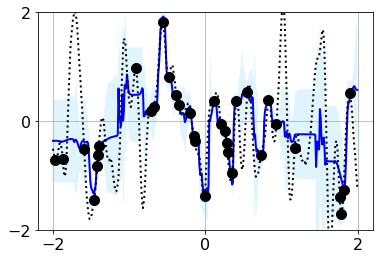

Iteration: 48000, loss: 0.8160478472709656


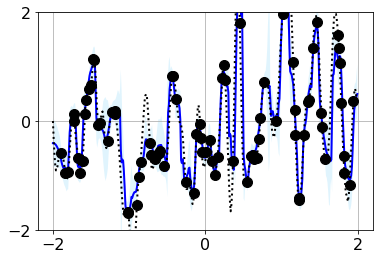

Iteration: 49000, loss: 0.9210463166236877


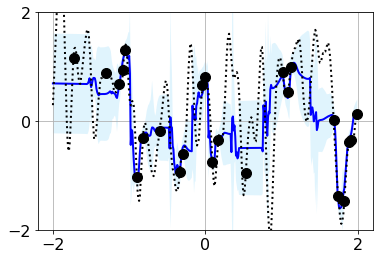

Iteration: 50000, loss: 0.022671116515994072


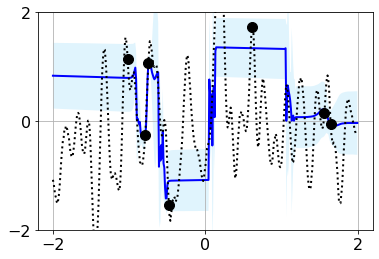

Iteration: 51000, loss: 0.2000422328710556


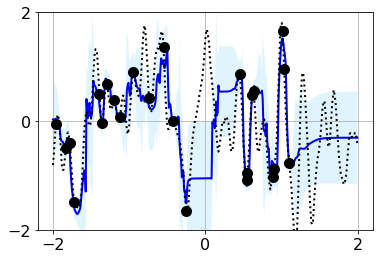

Iteration: 52000, loss: 0.8332067728042603


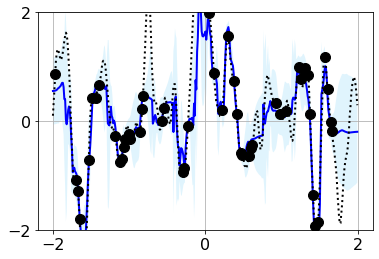

Iteration: 53000, loss: -0.308456152677536


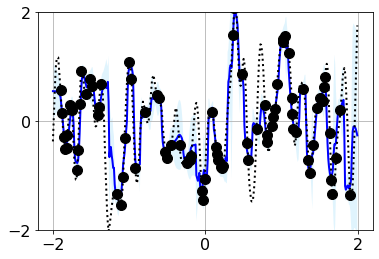

Iteration: 54000, loss: -0.05951905995607376


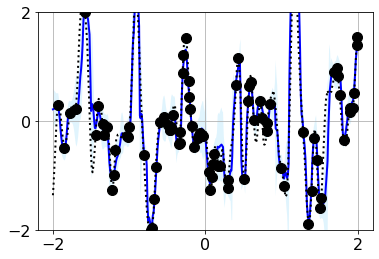

Iteration: 55000, loss: 0.0821908488869667


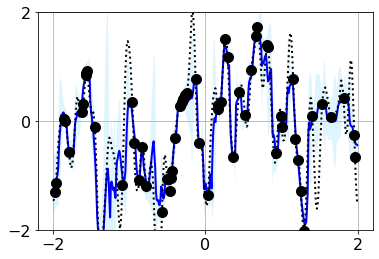

Iteration: 56000, loss: 0.17875200510025024


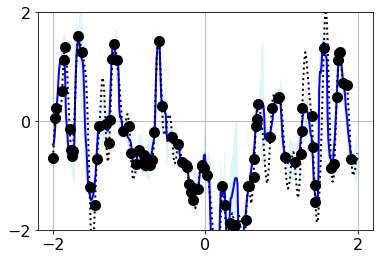

Iteration: 57000, loss: -0.45910215377807617


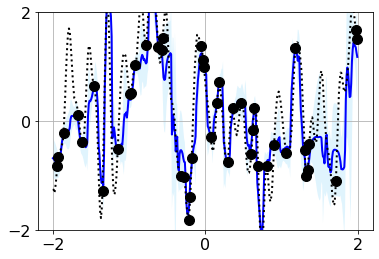

Iteration: 58000, loss: -0.05123241990804672


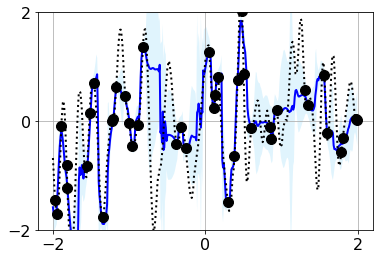

Iteration: 59000, loss: 0.8784162998199463


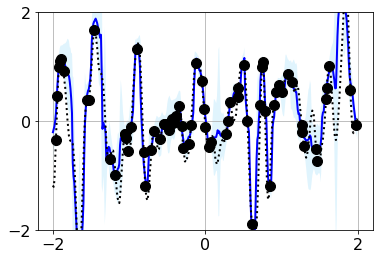

Iteration: 60000, loss: 0.6052914261817932


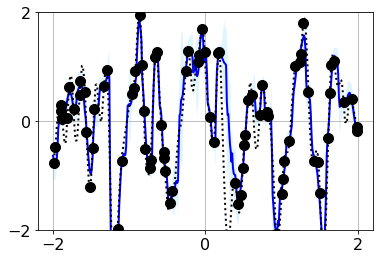

Iteration: 61000, loss: -0.3616929352283478


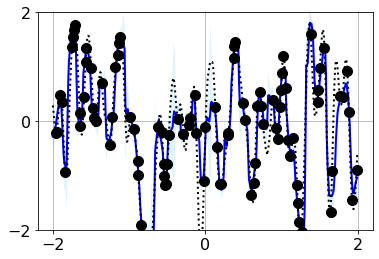

Iteration: 62000, loss: 0.1887545883655548


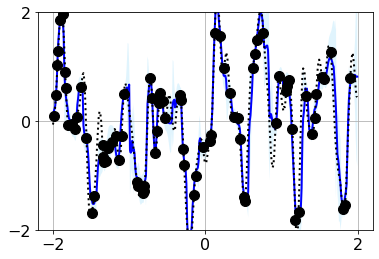

Iteration: 63000, loss: -0.5326071977615356


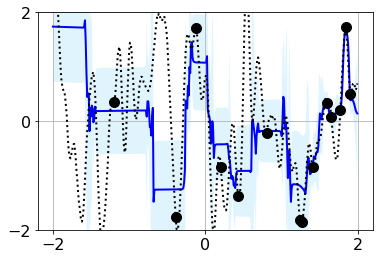

Iteration: 64000, loss: 0.41923096776008606


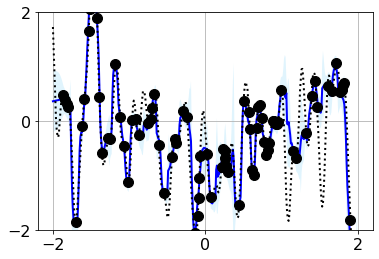

Iteration: 65000, loss: -0.4533834755420685


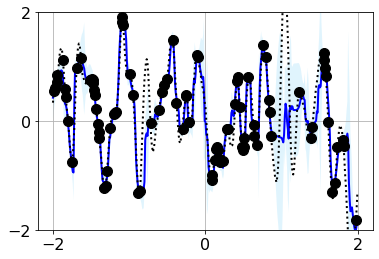

Iteration: 66000, loss: -0.24531032145023346


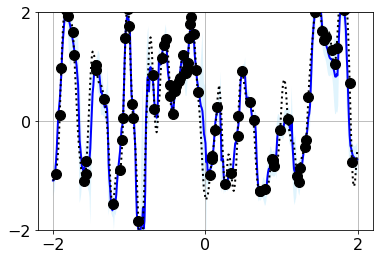

Iteration: 67000, loss: 0.22419871389865875


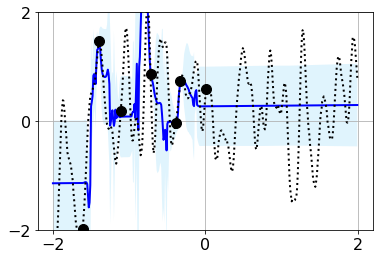

Iteration: 68000, loss: 0.24255596101284027


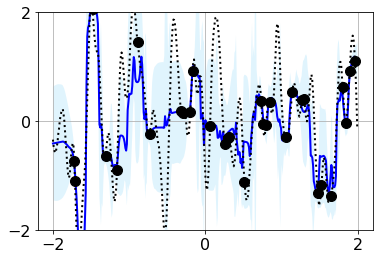

Iteration: 69000, loss: -0.13841810822486877


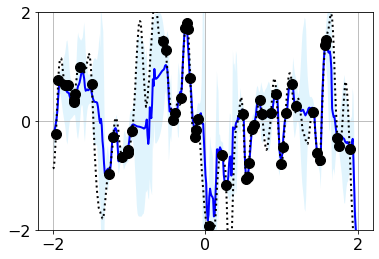

Iteration: 70000, loss: -0.33113735914230347


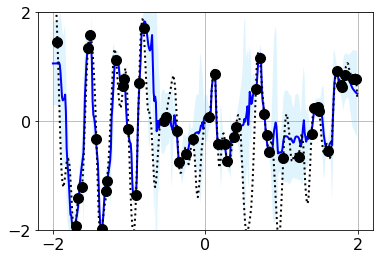

Iteration: 71000, loss: -0.18951112031936646


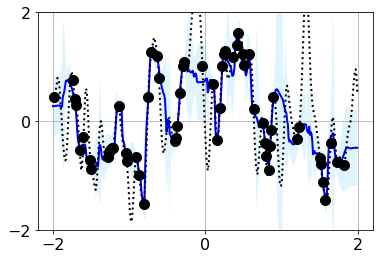

Iteration: 72000, loss: -0.04761836305260658


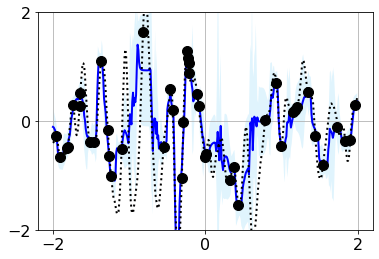

Iteration: 73000, loss: -0.18032638728618622


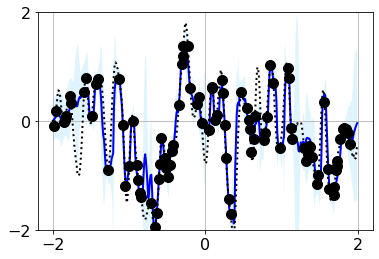

Iteration: 74000, loss: 1.1031076908111572


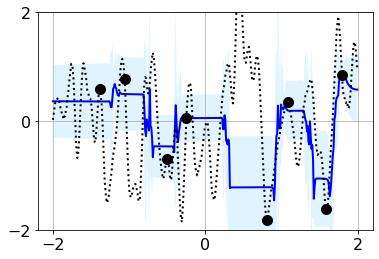

Iteration: 75000, loss: 0.3273243308067322


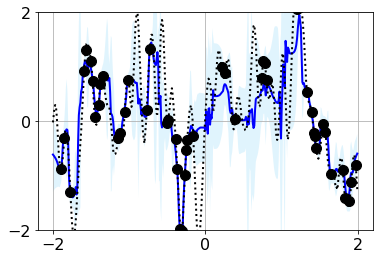

Iteration: 76000, loss: 0.08196768909692764


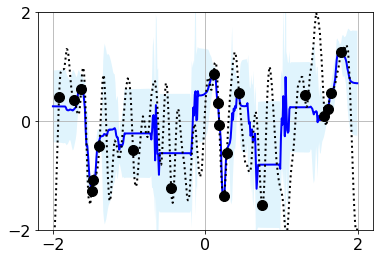

Iteration: 77000, loss: -0.34360456466674805


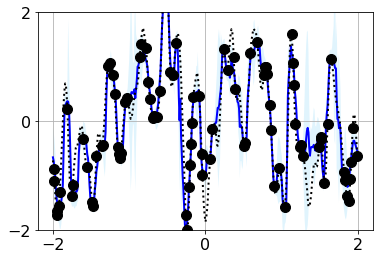

Iteration: 78000, loss: -0.13733959197998047


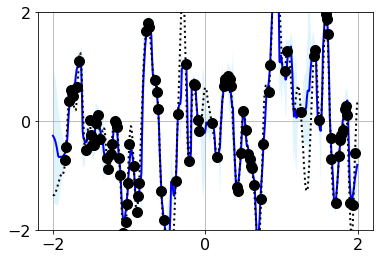

Iteration: 79000, loss: 0.09958143532276154


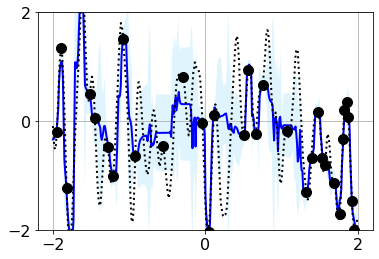

Iteration: 80000, loss: 0.45171865820884705


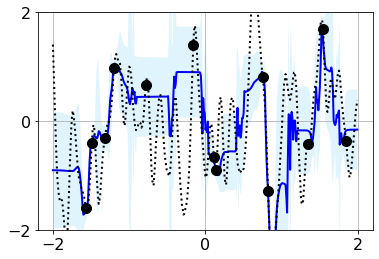

Iteration: 81000, loss: 0.2584242820739746


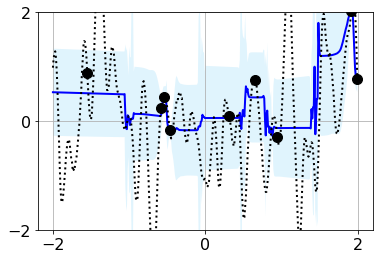

Iteration: 82000, loss: 1.6077057123184204


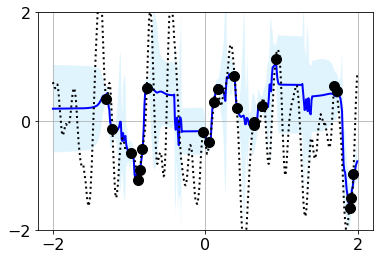

Iteration: 83000, loss: -0.31116020679473877


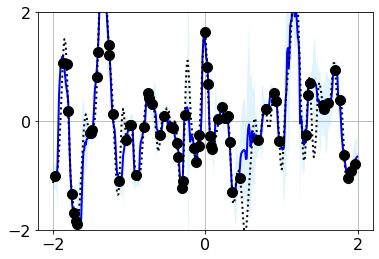

Iteration: 84000, loss: -0.4763523042201996


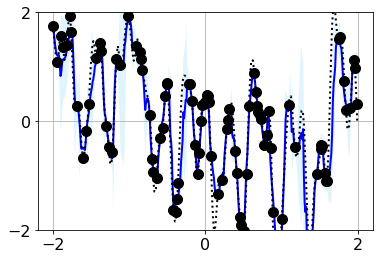

Iteration: 85000, loss: -0.7117915749549866


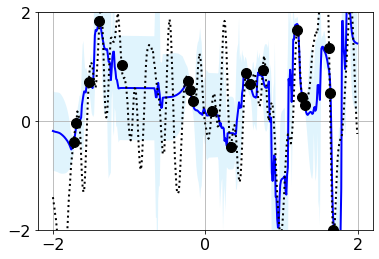

Iteration: 86000, loss: 1.2854602336883545


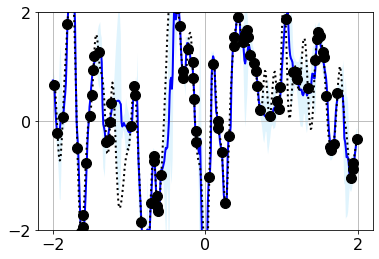

Iteration: 87000, loss: 0.5193844437599182


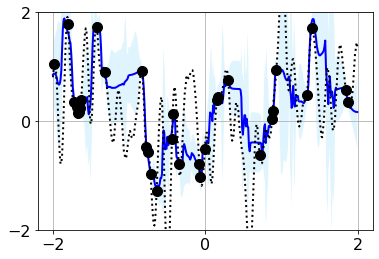

Iteration: 88000, loss: 0.4991150200366974


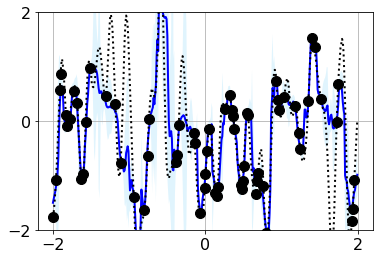

Iteration: 89000, loss: -0.6091102957725525


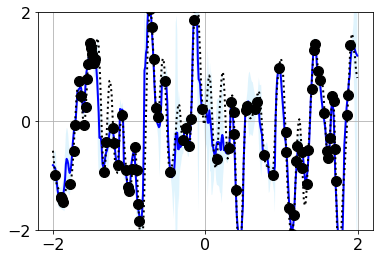

Iteration: 90000, loss: 1.2240891456604004


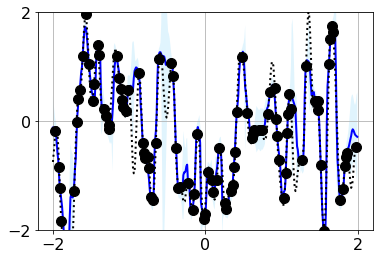

Iteration: 91000, loss: 0.9532727599143982


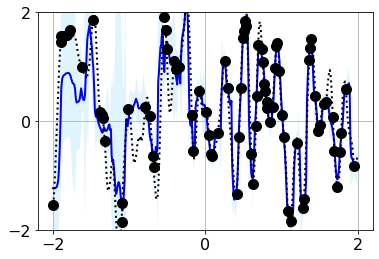

Iteration: 92000, loss: -0.13932830095291138


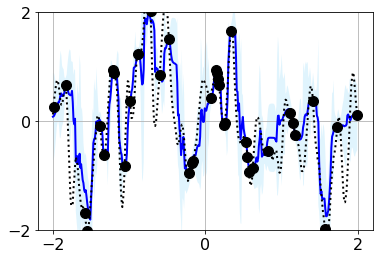

Iteration: 93000, loss: -0.5215051770210266


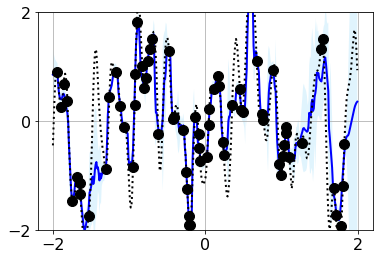

Iteration: 94000, loss: -0.23952016234397888


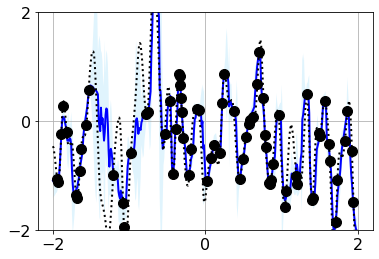

Iteration: 95000, loss: 0.3107745945453644


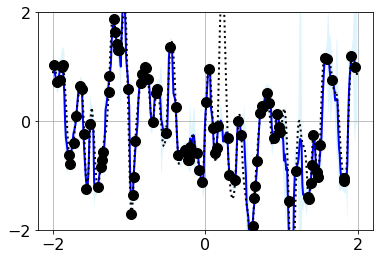

Iteration: 96000, loss: -0.3333025574684143


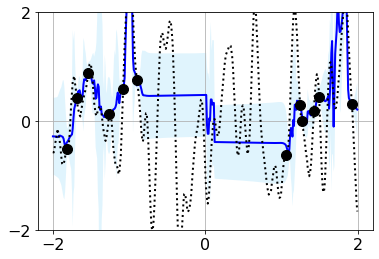

Iteration: 97000, loss: -0.6753918528556824


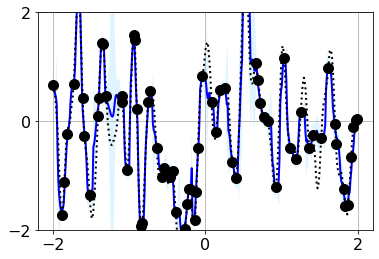

Iteration: 98000, loss: -0.15026073157787323


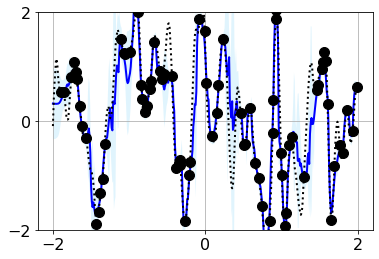

Iteration: 99000, loss: -0.5119898319244385


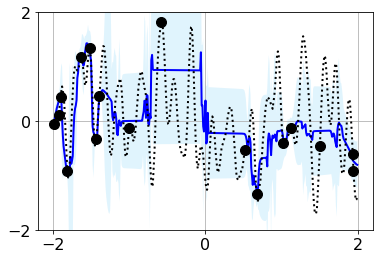

Iteration: 100000, loss: -0.11566205322742462


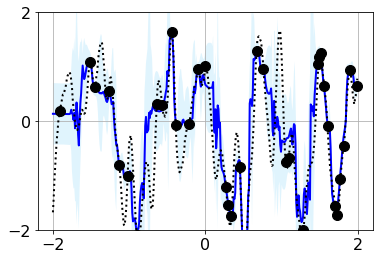

Iteration: 101000, loss: -0.5814332365989685


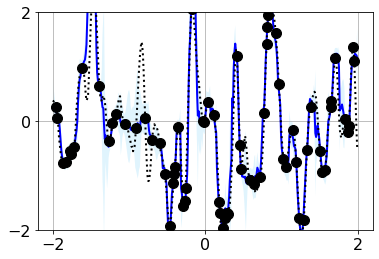

Iteration: 102000, loss: 1.4781959056854248


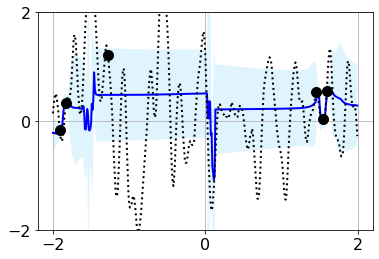

Iteration: 103000, loss: 0.8218947052955627


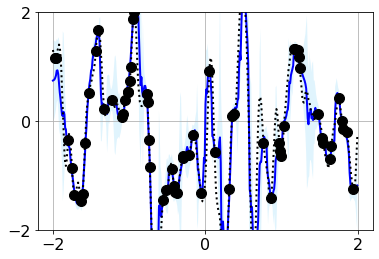

Iteration: 104000, loss: 0.9996962547302246


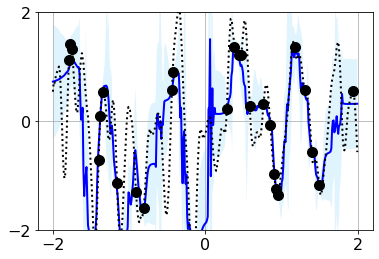

Iteration: 105000, loss: 0.4970678389072418


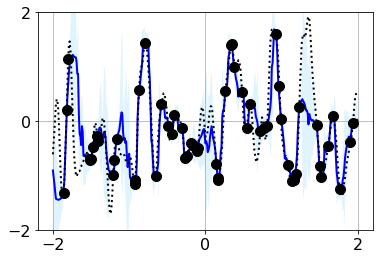

Iteration: 106000, loss: -0.3631231486797333


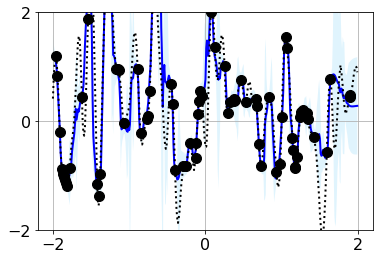

Iteration: 107000, loss: 0.5439931750297546


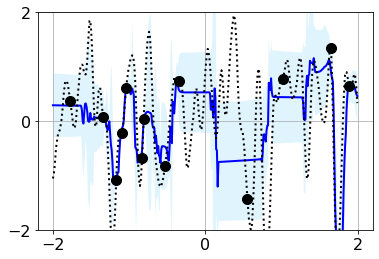

Iteration: 108000, loss: -0.37464433908462524


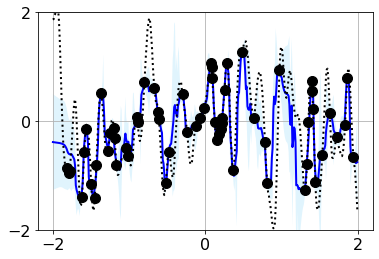

Iteration: 109000, loss: -0.29276809096336365


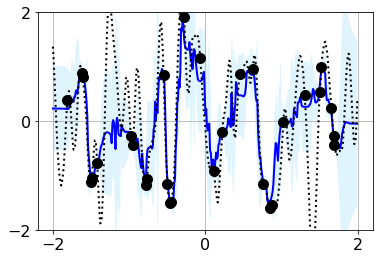

Iteration: 110000, loss: -0.5550219416618347


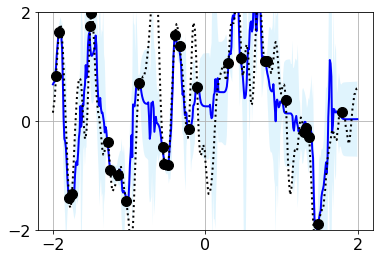

Iteration: 111000, loss: -0.16014763712882996


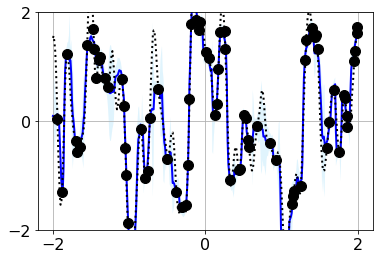

Iteration: 112000, loss: -0.7390432953834534


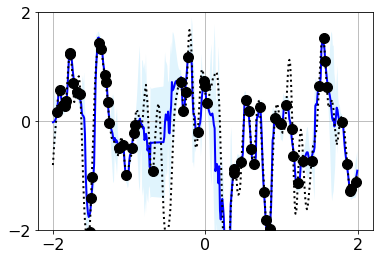

Iteration: 113000, loss: 0.5023923516273499


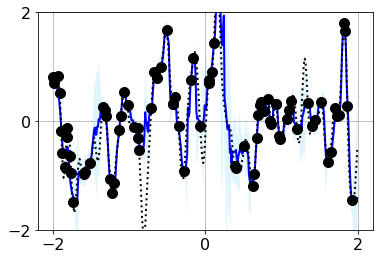

Iteration: 114000, loss: -0.7227190136909485


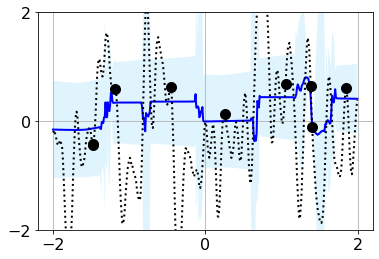

Iteration: 115000, loss: -0.7821130752563477


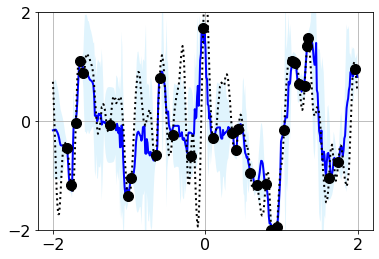

Iteration: 116000, loss: -0.6037065386772156


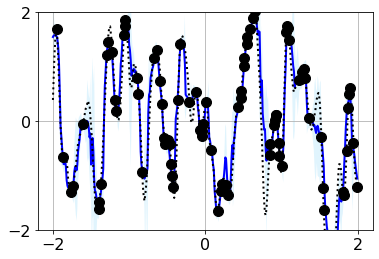

Iteration: 117000, loss: -0.40719881653785706


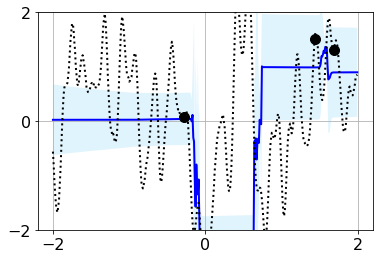

Iteration: 118000, loss: 0.4358769357204437


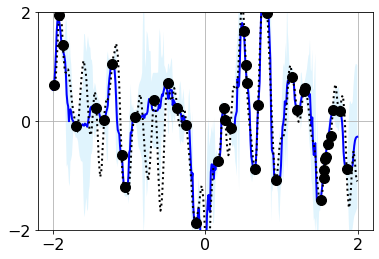

Iteration: 119000, loss: -0.2758364677429199


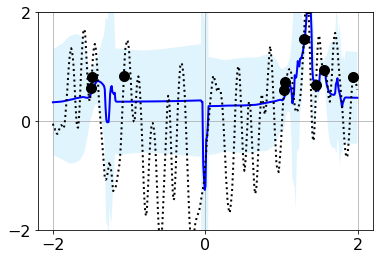

Iteration: 120000, loss: 0.11982189863920212


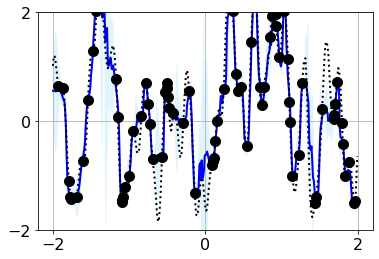

Iteration: 121000, loss: -0.4566136300563812


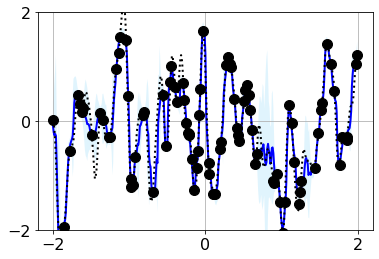

Iteration: 122000, loss: 0.7658448219299316


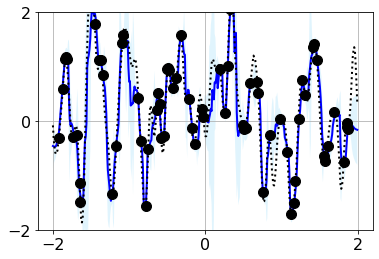

Iteration: 123000, loss: 1.0668224096298218


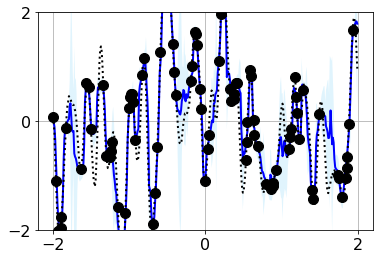

Iteration: 124000, loss: -0.7092427611351013


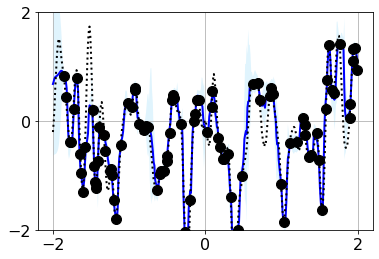

Iteration: 125000, loss: 1.0560537576675415


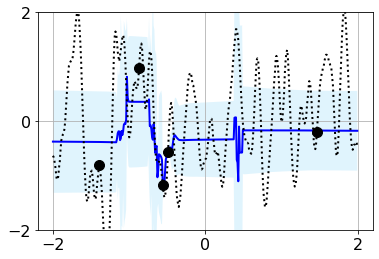

Iteration: 126000, loss: -0.14434856176376343


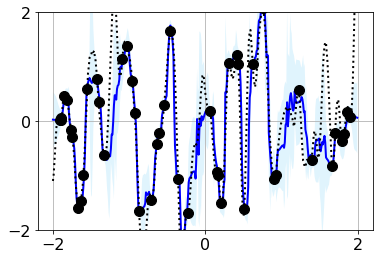

Iteration: 127000, loss: -0.643611490726471


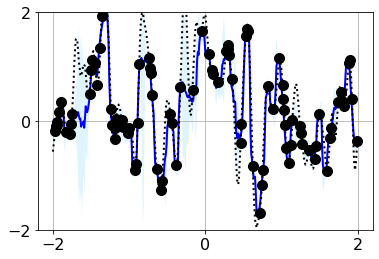

Iteration: 128000, loss: -0.6792087554931641


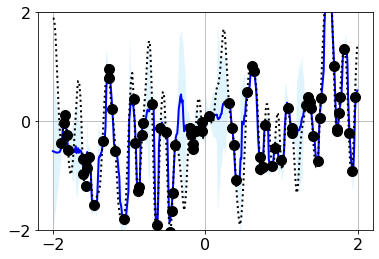

Iteration: 129000, loss: 0.24538561701774597


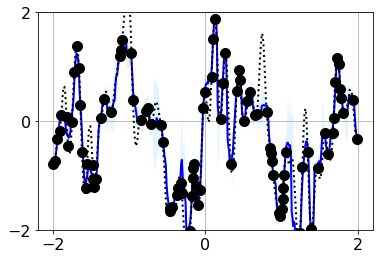

Iteration: 130000, loss: 0.5630578994750977


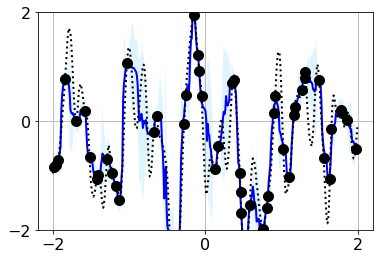

Iteration: 131000, loss: 0.5742303133010864


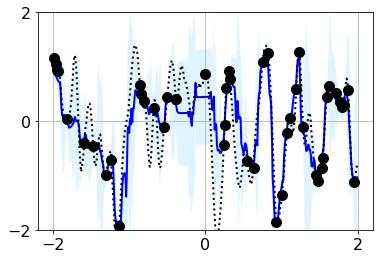

Iteration: 132000, loss: -0.6728116273880005


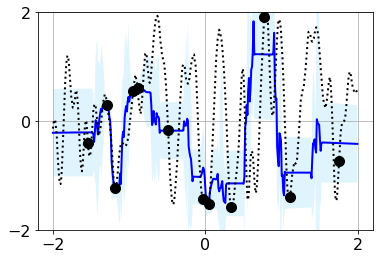

Iteration: 133000, loss: -0.9369068145751953


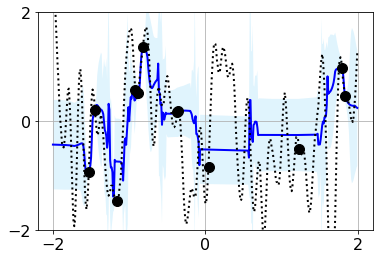

Iteration: 134000, loss: -0.14708846807479858


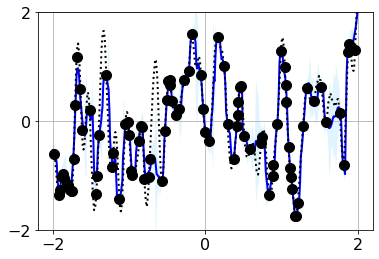

Iteration: 135000, loss: -0.7923302054405212


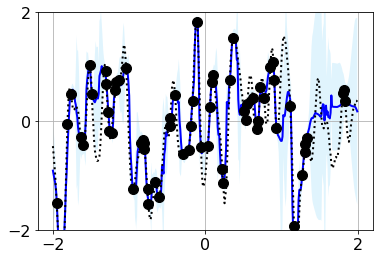

Iteration: 136000, loss: -0.40732237696647644


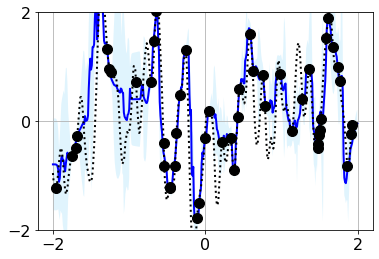

Iteration: 137000, loss: 0.765320897102356


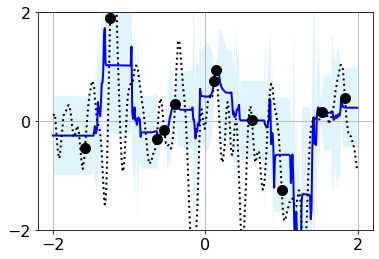

Iteration: 138000, loss: 0.6175041794776917


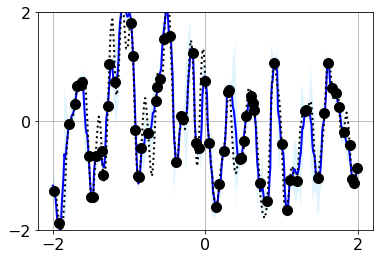

Iteration: 139000, loss: -0.6382763981819153


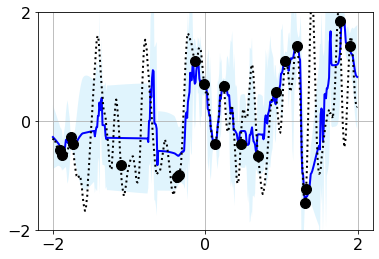

Iteration: 140000, loss: -0.7422784566879272


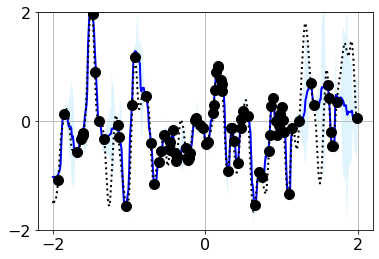

Iteration: 141000, loss: -0.2635937035083771


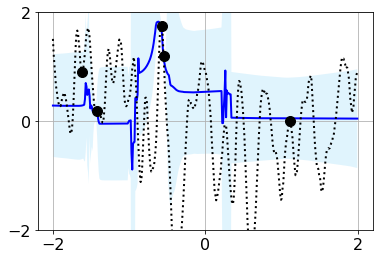

Iteration: 142000, loss: 0.4061424434185028


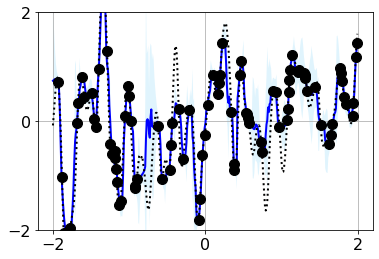

Iteration: 143000, loss: -0.6025177836418152


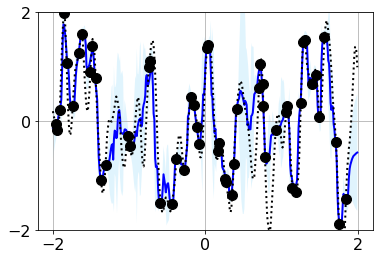

Iteration: 144000, loss: -0.6459983587265015


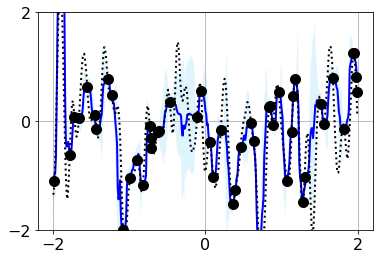

Iteration: 145000, loss: -0.20862264931201935


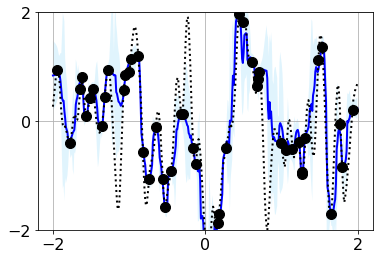

Iteration: 146000, loss: -0.7523307204246521


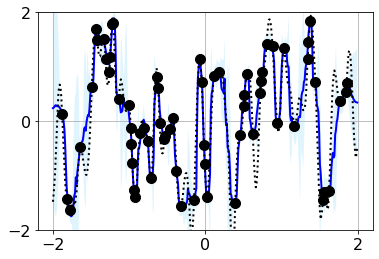

Iteration: 147000, loss: -0.643672525882721


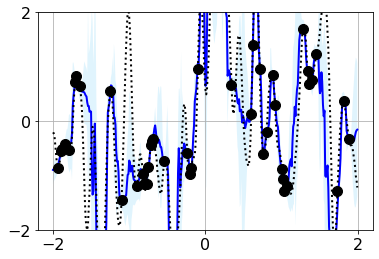

Iteration: 148000, loss: 1.1181306838989258


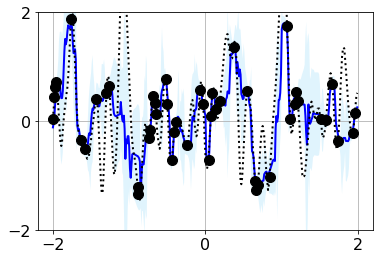

Iteration: 149000, loss: -0.23918141424655914


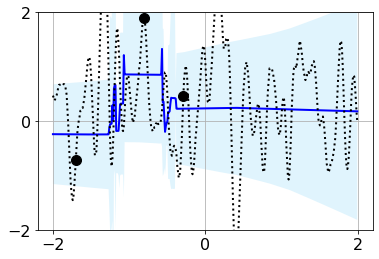

Iteration: 150000, loss: -0.7486261129379272


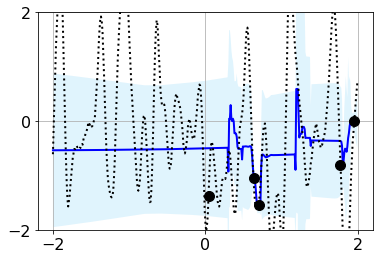

Iteration: 151000, loss: -0.6205428242683411


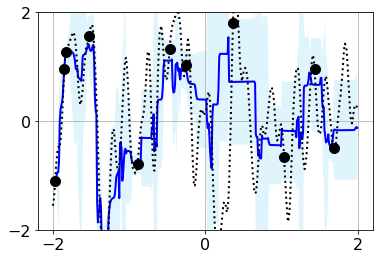

Iteration: 152000, loss: -0.34520092606544495


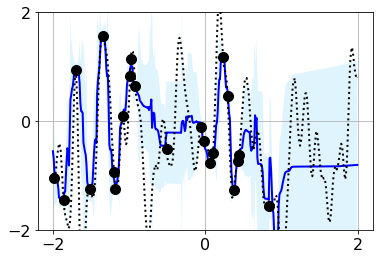

Iteration: 153000, loss: -0.2301526814699173


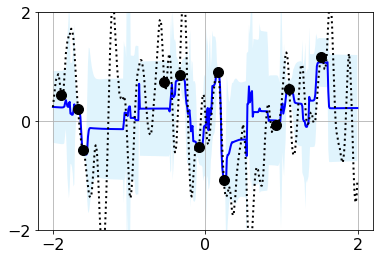

Iteration: 154000, loss: 0.807365894317627


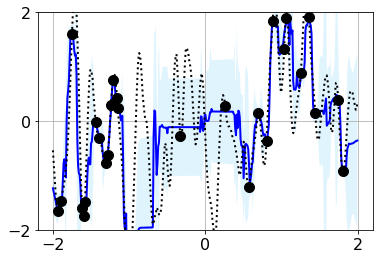

Iteration: 155000, loss: 0.5042805075645447


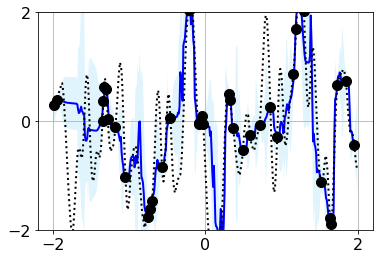

Iteration: 156000, loss: -0.3209505081176758


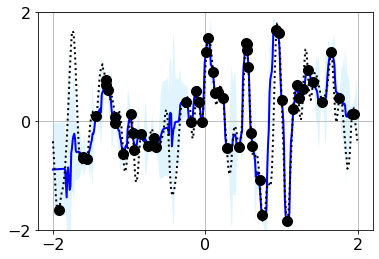

Iteration: 157000, loss: 0.37832099199295044


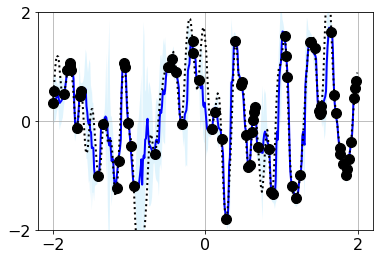

Iteration: 158000, loss: 1.3418545722961426


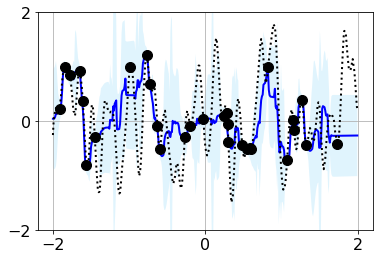

Iteration: 159000, loss: -0.7437013387680054


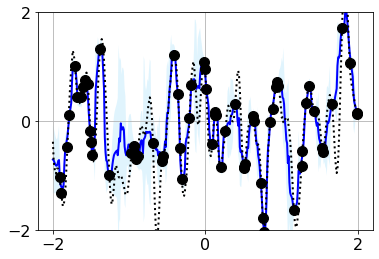

Iteration: 160000, loss: 0.23846875131130219


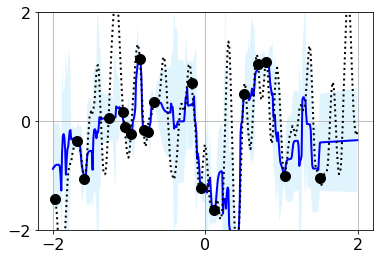

Iteration: 161000, loss: -0.5174202919006348


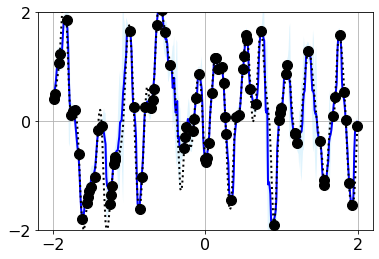

Iteration: 162000, loss: -0.8827269077301025


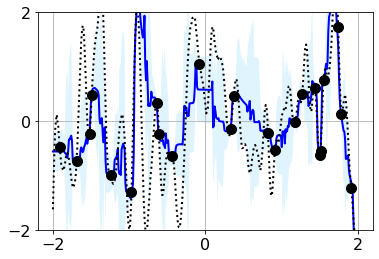

Iteration: 163000, loss: 0.020907940343022346


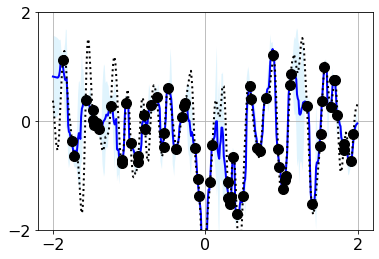

Iteration: 164000, loss: -0.9729188084602356


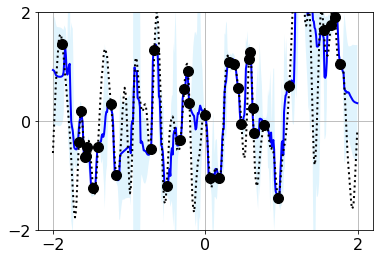

Iteration: 165000, loss: -0.8038725852966309


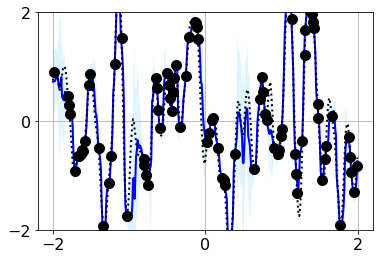

Iteration: 166000, loss: 1.0212677717208862


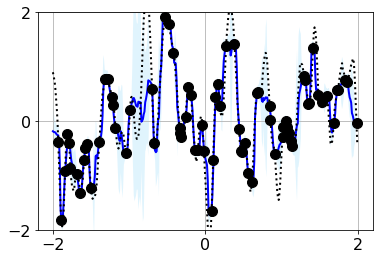

Iteration: 167000, loss: -0.5773810744285583


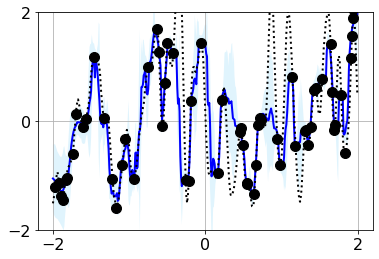

Iteration: 168000, loss: 1.1273000240325928


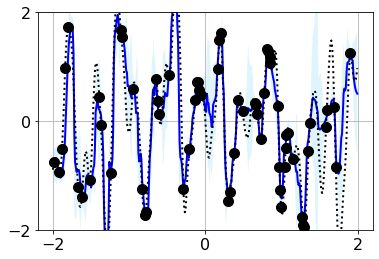

Iteration: 169000, loss: -0.9506338238716125


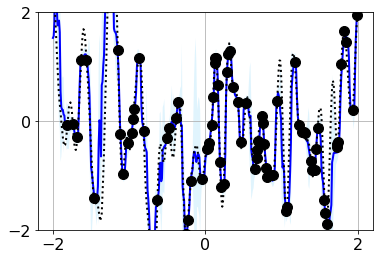

Iteration: 170000, loss: -0.49885451793670654


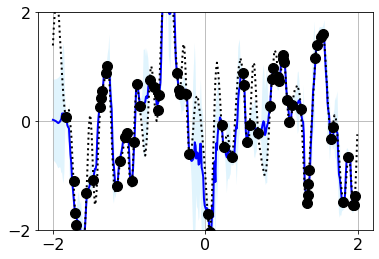

Iteration: 171000, loss: -0.2524258494377136


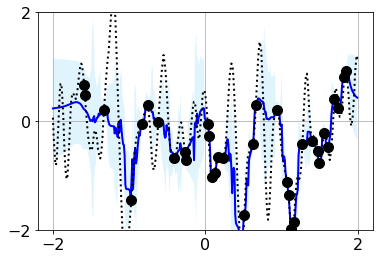

Iteration: 172000, loss: 1.4362927675247192


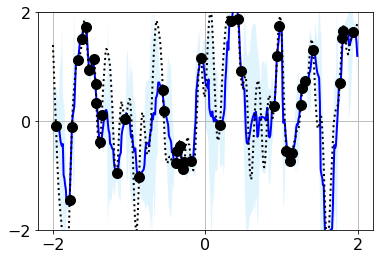

Iteration: 173000, loss: -0.6208567023277283


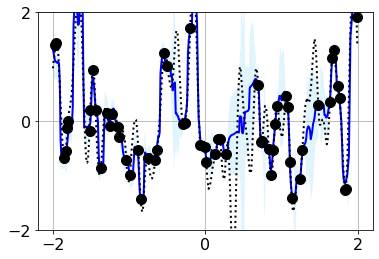

Iteration: 174000, loss: -0.3136957883834839


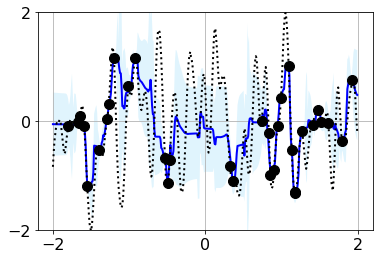

Iteration: 175000, loss: 0.5633080005645752


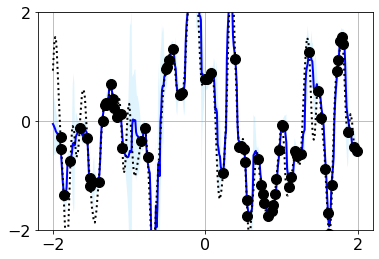

Iteration: 176000, loss: -0.6469253897666931


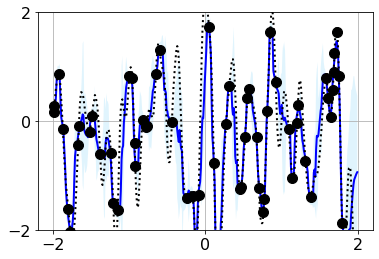

Iteration: 177000, loss: 0.5816232562065125


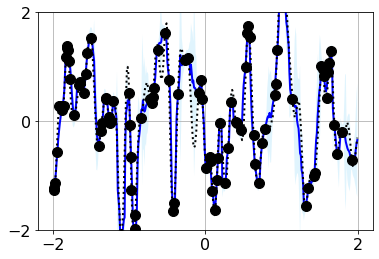

Iteration: 178000, loss: -0.45953431725502014


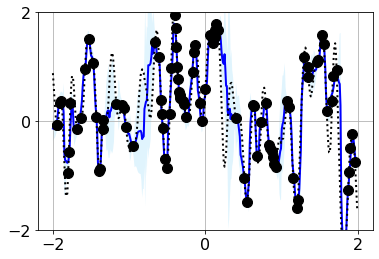

Iteration: 179000, loss: 1.1491894721984863


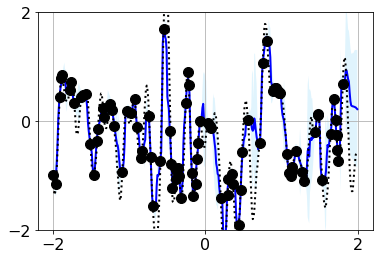

Iteration: 180000, loss: 1.0834921598434448


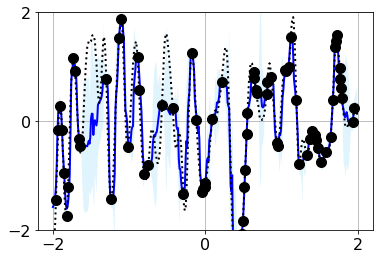

Iteration: 181000, loss: -0.8233623504638672


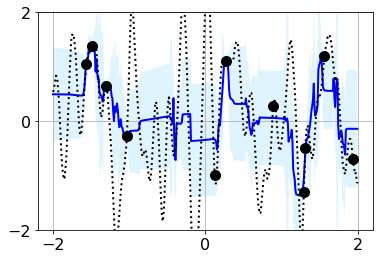

Iteration: 182000, loss: -0.6079471707344055


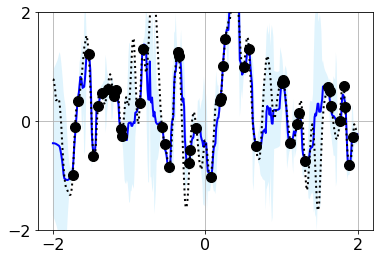

Iteration: 183000, loss: 0.01661100424826145


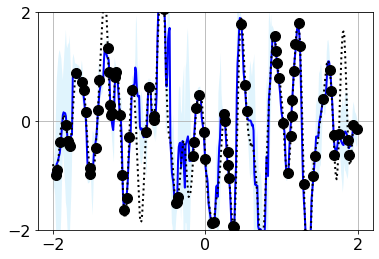

Iteration: 184000, loss: -1.0092239379882812


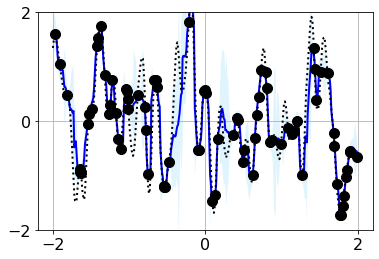

Iteration: 185000, loss: 1.0502971410751343


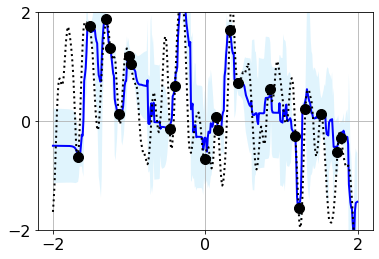

Iteration: 186000, loss: 0.9457026720046997


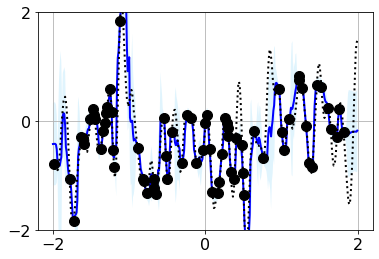

Iteration: 187000, loss: -0.6796367764472961


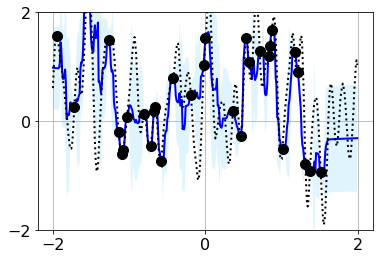

Iteration: 188000, loss: 0.9835075736045837


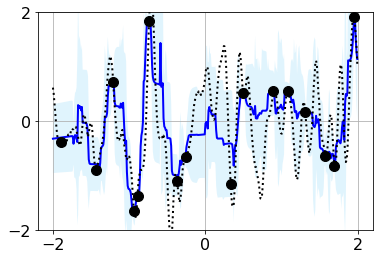

Iteration: 189000, loss: 1.1562721729278564


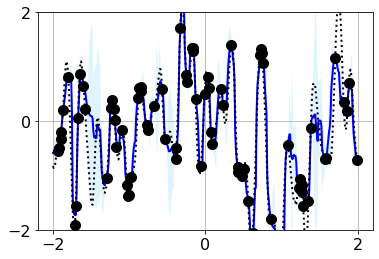

Iteration: 190000, loss: -0.809836208820343


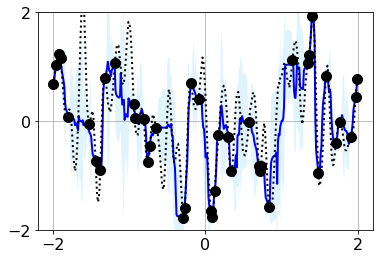

Iteration: 191000, loss: 0.48671507835388184


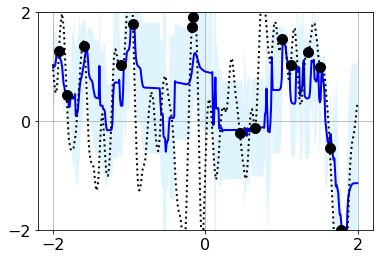

Iteration: 192000, loss: -0.4044255018234253


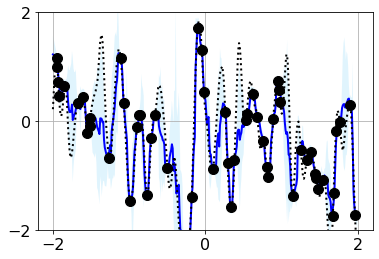

Iteration: 193000, loss: -1.0002315044403076


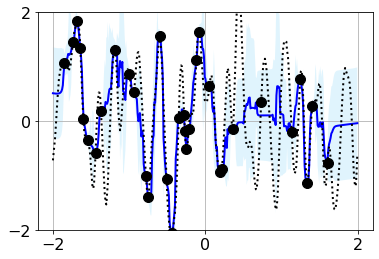

Iteration: 194000, loss: -0.656988799571991


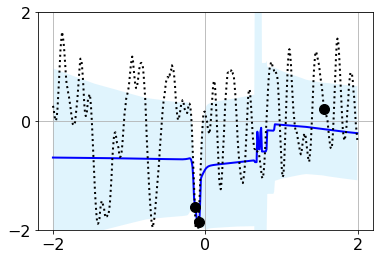

Iteration: 195000, loss: -0.47382569313049316


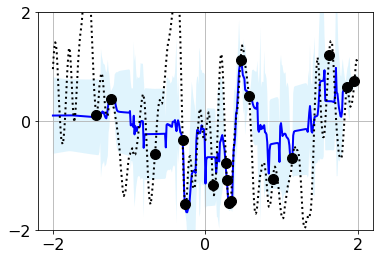

Iteration: 196000, loss: -0.7498824596405029


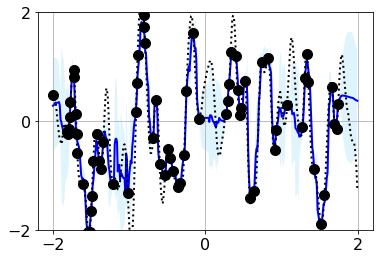

Iteration: 197000, loss: -0.6413261294364929


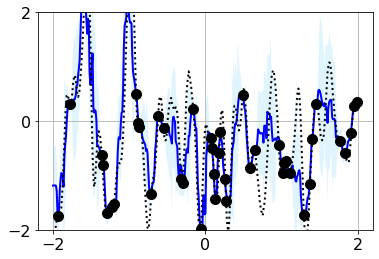

Iteration: 198000, loss: 0.040397241711616516


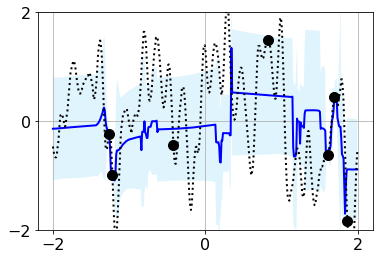

Iteration: 199000, loss: -0.7209879755973816


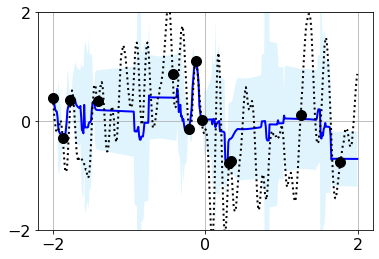

In [12]:
# Train and plot
sess = tf.Session()
sess.run(init)

for it in range(TRAINING_ITERATIONS):
    sess.run([train_step])

    loss_value, pred_y, std_y, target_y, whole_query = sess.run(
          [loss, mu, sigma, data_test.target_y, 
           data_test.query])
    
    ewma_value = 0.99 * ewma_value + (1 - 0.99) * loss_value
    ewma_list.append(ewma_value)
    
    # Plot the predictions in `PLOT_AFTER` intervals
    if it % PLOT_AFTER == 0:
        (context_x, context_y), target_x = whole_query
        print('Iteration: {}, loss: {}'.format(it, loss_value))

        # Plot the prediction and the context
        plot_functions(target_x, target_y, context_x, context_y, pred_y, std_y)

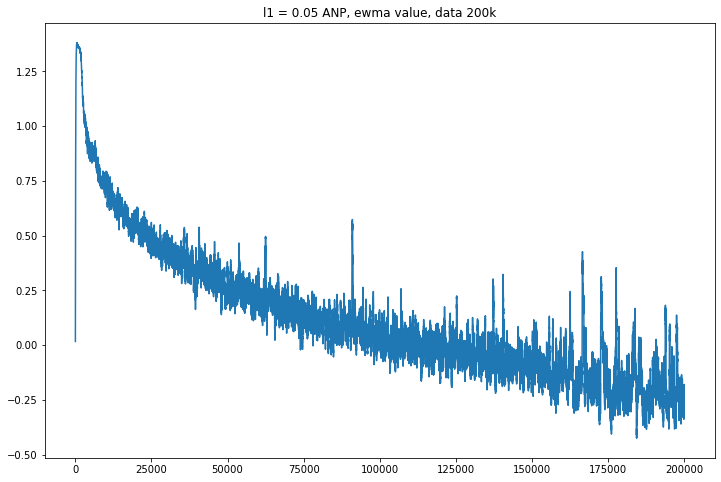

In [13]:
### plot the ewma
plt.figure(figsize=(12, 8))
plt.title('l1 = 0.05 ANP, ewma value, data 200k')
plt.plot(ewma_list)

In [14]:
saver = tf.train.Saver()
saver.save(sess, '../save_anp_models/anp_100context_l1_5e-2_data_200k_v1')

'../save_anp_models/anp_100context_l1_5e-2_data_200k_v1'